LivestockFish_FoodSupplyQuantity

# Pre-Load

### Libraries and Settings

In [1]:
"""Modules"""

import urllib.request, urllib.parse, urllib.error
import requests
from bs4 import BeautifulSoup

import lxml
import re
import os
import time
import datetime
import chardet
import zipfile
from zipfile import ZipFile
import json
from io import BytesIO

from IPython.display import display

import matplotlib.pyplot as plt
import matplotlib.transforms
%matplotlib inline

import folium
from PIL import Image

import numpy as np
import pandas as pd

pd.set_option('precision', 4)
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)
pd.set_option('max_colwidth',100)

def curl(url,path,mode='wb'):
    response = urllib.request.urlopen(url).read()
    with open(path, mode) as handle:
        handle.write(response)

### Variables

In [3]:
"""小写开头的字母用于临时变量"""

# data -- 用于创建表格的临时数据，创建完后必须赋值给永久变量
# df   -- 用于画图的临时数据，画图时将所需数据赋值给它
# dfs  -- 用于画图的临时数据字典，画图时将所需数据赋值给它
# domain
# 其他小写字母


"""初始化全局变量，请小心操作"""

# 用户自定义参数，会随着用户设置的变化而变化
D = ''    # Domain
A = ''    # Area     单一的国家/地区，
As = []
E = ''    # Element
Es = []
I = ''    # A paticular Item
Is = []   # Items

# 根据用户变量生成
DFs = {}        # 每个 Domain 的所有数据是一份 DF，keys=Domains，no index, columns=['Area Code', 'Area', 'Element', 'Item', 'Year', 'Unit', 'Value']
CDTs = {}       # 从DFs筛选数据的条件，key0=Domain, key1=Area, key2=Element, value=Items
PVs_AreaYear = {}        # 从DFs根据筛选条件生成的 DICT, key0=Domain, key1=Area, key2=Element, key3=Items, values=DF, index=Areas, columns=Years
PVs_YearArea = {}        # 从DFs根据筛选条件生成的 DICT, key0=Domain, key1=Area, key2=Element, key3=Items, values=DF, index=Years, columns=Areas

Years = []      # 年份列表

PVs_AG = {}     # 某国家地区与其所在组合的某些 Items 的比较，key0=Domain, key1=Area, key2=Element, key3=[AG, A, G], index=Years, columns=[C,G]

# 必要的信息 
DOMs = {}        # Domain 的描述字典， key=domain_name(file name's pref)
LIST_countries=[]  # 国家级地区列表，Area Code < 5000, default refer to  worlds contries
LIST_groups=[]    # 地区组合列表，Area Code >= 5000, default grouped by continents


""" DIRECTOR SETTINGS"""

FAO_DOWNLOADS_ROOT = 'http://fenixservices.fao.org/faostat/static/bulkdownloads/'
FAO_DOWNLOADS_XML = os.path.join(FAO_DOWNLOADS_ROOT, 'datasets_E.xml')
FAO_DOWNLOADS_JSON = os.path.join(FAO_DOWNLOADS_ROOT, 'datasets_E.json')
FAO_DOWNLOADS_BULK = os.path.join(FAO_DOWNLOADS_ROOT, 'FAOSTAT.zip')

print(f'FAOSTAT downloads root: {FAO_DOWNLOADS_ROOT}')
print(f'FAOSTAT description in .xml: {FAO_DOWNLOADS_XML}')
print(f'FAOSTAT description in .json: {FAO_DOWNLOADS_JSON}')
print(f'FAOSTAT downloads .zip: {FAO_DOWNLOADS_BULK}')

# what is the relevent path of root
root_where = '../../'
print('+++++++++ Atention ++++++++++')
print(f'The root is set as "{root_where}" relevent to this file.' )
print(f'If it is not right, you change this parameter where the parameter name is "root_where".' )
print('+++++++++++++++++++++++++++++')

LOCAL_ROOT = os.path.abspath(root_where)
DATA_BASE = os.path.join(LOCAL_ROOT, 'data')
print(f'Root director: {LOCAL_ROOT}')
print(f'Data director: {DATA_BASE}')

DATA_FAO = os.path.join(DATA_BASE, 'FAO')
FAO_meta = os.path.join(DATA_FAO, 'metadata')
FAO_description_path = FAO_meta + '/datasets_E.xml'
FAO_BULK_zip = DATA_FAO + '/FAOSTAT.zip'
print(f'FAO data director: {DATA_FAO}')
print(f'FAO metadata director: {FAO_meta}')
print(f'FAO local description file: {FAO_description_path}')
print(f'FAO local datasets zip: {FAO_BULK_zip}')

SUFFIX = '_E_All_Data_(Normalized)'  # suffix of fao data file name
print(f'Suffix of raw FAO data file name: {SUFFIX}')


# DATA_NBS = os.path.join(DATA_BASE, 'NBS')
# DATA_hybrids = os.path.join(DATA_BASE, 'hybrids')

# print(f'NBS data director: {DATA_NBS}')
# print(f'Datasets hybrids director: {DATA_hybrids}')

FAOSTAT downloads root: http://fenixservices.fao.org/faostat/static/bulkdownloads/
FAOSTAT description in .xml: http://fenixservices.fao.org/faostat/static/bulkdownloads/datasets_E.xml
FAOSTAT description in .json: http://fenixservices.fao.org/faostat/static/bulkdownloads/datasets_E.json
FAOSTAT downloads .zip: http://fenixservices.fao.org/faostat/static/bulkdownloads/FAOSTAT.zip
+++++++++ Atention ++++++++++
The root is set as "../../" relevent to this file.
If it is not right, you change this parameter where the parameter name is "root_where".
+++++++++++++++++++++++++++++
Root director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas
Data director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data
FAO data director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data/FAO
FAO metadata director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data/FAO/metadata
FAO local description file: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data/FAO/metadata/datasets_E.xml
FAO local datasets zip: /mnt/sda2

### Meta Data

In [4]:
def FAO_description_dic(soup):
    """
    input soup parsed by bs4
    parse it to dict with nessesary info
    """
    dic = {}
    for dataset in soup.find_all('Dataset'):
        file_loc = dataset.FileLocation.string
        domain = file_loc[file_loc.find('bulkdownloads/')+len('bulkdownloads/'):file_loc.find('_E_All')]
        dic[domain] = {'DatasetCode': dataset.DatasetCode.string,
                        'DatasetName': dataset.DatasetName.string,
                        'Topic': dataset.Topic.string,
                        'DatasetDescription': dataset.DatasetDescription.string,
                        'MedaData': [dataset.Contact.string, dataset.Email.string, dataset.DateUpdate.string, dataset.CompressionFormat.string, dataset.FileType.string, dataset.FileSize.string, dataset.FileRows.string],
                        'Url_Normalized':dataset.FileLocation.string}
    return dic

In [5]:
""" If you need to update, uncomment this cell. """
# # Download or update FAOSTAT datasets if necessary
# if os.path.exists(FAO_description_path) or os.path.exists(FAO_BULK_zip): pass
# else: 
#     print('Need to download or update FAOSTAT datasets.')
#     print('Processing ...')
#     curl(url=FAO_DOWNLOADS_XML, path=FAO_description_path)
#     curl(url=FAO_DOWNLOADS_BULK, path=FAO_BULK_zip)
    
# # Check local datasets update  
# print('Checking updates ...')

# # local datasets
# print('Checking Local description ...')
# with open(FAO_description_path, 'rb') as handle:
#     xml = handle.read()
#     soup = BeautifulSoup(xml, 'xml')
# xml_local = FAO_description_dic(soup)

# # online datasets
# print('Checking latest description ...')
# response = requests.get(FAO_DOWNLOADS_XML)
# xml = response.content
# soup = BeautifulSoup(xml, 'xml')
# xml_online = FAO_description_dic(soup)

# # compare
# print('Comparing ...')
# shared_items = {k: xml_local[k] for k in xml_local if k in xml_online and xml_local[k] == xml_online[k]}
# need_update = {k: xml_local[k] for k in xml_local if xml_local[k] != xml_online[k]}
# update_to = {k: xml_local[k] for k in xml_local if xml_local[k] != xml_online[k]}

# print('No. of local datasets: ', len(xml_local))
# print('No. of latest datasets: ', len(xml_online))
# print('No. of shared datasets: ', len(shared_items))

# if len(xml_local)==len(shared_items) and len(xml_local)==len(xml_online):
#     print ('Already up to date.')
# else:
#     print('Need update: ', need_update)
#     print('Update to: ', update_to)
#     print("NOTE: If you don't concern about datasets listed above, there's no need to update!")
    
# print('Done succesfully.')

' If you need to update, uncomment this cell. '

In [6]:
with open(FAO_description_path, 'rb') as handle:
    xml = handle.read()
    soup = BeautifulSoup(xml, 'xml')
DOMs = FAO_description_dic(soup)
# display(DOMs)

# 加载国家列表
LIST_countries = []
with open(FAO_meta+'/list_countries_world.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_countries.append(line)
LIST_countries.remove('China')  # Because we use `China, mainland`
print(f'There are {len(LIST_countries)} countries.')
# display(LIST_countries)

# 加载区域/组合列表
LIST_groups = []
with open(FAO_meta+'/list_groups_world.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_groups.append(line)
COUNT_groups = len(LIST_groups)
print(f'There are {len(LIST_groups)} groups.')
# display(LIST_groups)

# 自定义常用区域/组合列表
# OECD
LIST_countries_OECD = []
with open(FAO_meta+'/list_countries_OECD.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_countries_OECD.append(line)
print(f'There are {len(LIST_countries_OECD)} OECD countries.')
# display(LIST_countries_OECD)

# Asia
LIST_countries_asia = []
with open(FAO_meta+'/list_countries_asia.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_countries_asia.append(line)
print(f'There are {len(LIST_countries_asia)} Asian countries.')
# display(LIST_countries_asia)

There are 225 countries.
There are 34 groups.
There are 36 OECD countries.
There are 53 Asian countries.


### Plot Style

In [7]:
plt.style.use(['ggplot'])

# font size
TIT_size = 13    # titles
LAB_size = 10    # labels
LEG_size = 10    # legends
TCK_size = 10    # ticklabels

LIN_wei = 1.5    # line weights
BAR_wid = 4      # bar width
GRD_wid = 0.5    # grid line width
GRD_clr = 'white' 
GRD_aph = 1     # grid alpha

CLs = ('#ffab91','#c62828','#689f38','#ff6f00','#8c9eff','#ffc400','#283593',
       'chocolate','r','orange','maroon','hotpink','b','yellowgreen','deepskyblue','g','c','lightslategray','k')
MKs = ('o', 'x','o','x', 'v','.','v','.','o','x','o', 'x', 'v','.','v','.')
LSs = ('-','-','--', ':', ':','-.','-.','-','-','--','--', ':', ':','-.','-.')

# =============================================================================================================
def setX_quant(ax, ticks, step, label = ''):
    ax.set_xticks(ticks)
    ax.set_xlim(ticks[0]-step/2,ticks[-1]+step/2)
    ax.set_xticklabels(ticks, rotation=0, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setX_quali(ax, ticks, label = ''):
    ax.set_xticklabels(ticks, rotation=90, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

def setY_quant(ax, y_max, label = ''):
    tick_num = 9
    step = y_max/(tick_num-1)
    min_gap = 10
    
    if step < 1:
        step = round(step,1)
        dec=1
    elif step < 10:
        step = int(step)
        dec=0
    elif step/min_gap < 10:
        step = int(step/min_gap)*10
        dec=0
    else:
        n=0
        while step/min_gap >= 10:
            step = int(step/min_gap)
            n += 1
        step = int(step/min_gap)*(min_gap**(n+1))
        dec=0
        
    y_max = step*(tick_num+1)        
    ticks = np.round(np.arange(0, y_max+step, step),decimals=dec)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel(label, fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setY_per(ax):
    ticks=np.round(np.linspace(0, 100, num=11, endpoint=True), decimals=0)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Percentage (%)', fontsize=LAB_size)
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

## Setting Variables

### Domain Selection - 'FoodSupply_LivestockFish'

In [11]:
def rdDF(domain):
    
    display(DOMs[domain])
    
    zf = ZipFile(f'{DATA_FAO}/{domain}{SUFFIX}.zip')
    encodings = ["ISO-8859-1", "UTF-8", "UTF-8-SIG", "GBK"]
    for encoding in encodings:
        try:
            data = pd.read_csv(zf.open(f'{domain}{SUFFIX}.csv'), encoding=encoding)
        except:
            pass
    
    display(data.head())
    display(data.tail())

    return data

In [12]:
# 给 Domain 赋值，查看数据基础信息
D = 'FoodSupply_LivestockFish'

In [13]:
""" Check update information if you've run update cell before, and if the domain has been updated , uncomment this cell. """
# with ZipFile(FAO_BULK_zip, 'r') as zf1:
#     zf1.extract(f'{D}{SUFFIX}.zip', DATA_FAO)    

" Check update information if you've run update cell before, and if the domain has been updated , uncomment this cell. "

In [14]:
# 给Domain赋值
# Show you raw data
DATA = rdDF(D)
print('data shape: ', DATA.shape)

{'DatasetCode': 'CL',
 'DatasetName': 'Food Balance: Food Supply - Livestock and Fish Primary Equivalent',
 'Topic': 'Most crop and livestock products, including processed products, under agricultural activity.',
 'DatasetDescription': 'Food supply data is some of the most important data in FAOSTAT. In fact, this data is for the basis for estimation of global and national undernourishment assessment, when it is combined with parameters and other data sets. This data has been the foundation of food balance sheets ever since they were first constructed. The data is accessed by both business and governments for economic analysis and policy setting, as well as being used by the academic community.',
 'MedaData': ['Mr. Salar Tayyib',
  'faostat@fao.org',
  '2018-01-17',
  'zip',
  'csv',
  '13789KB',
  '2029430'],
 'Url_Normalized': 'http://fenixservices.fao.org/faostat/static/bulkdownloads/FoodSupply_LivestockFish_E_All_Data_(Normalized).zip'}

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
0,2,Afghanistan,2731,Bovine Meat,641,Food supply quantity (tonnes),1961,1961,tonnes,43000.0,S
1,2,Afghanistan,2731,Bovine Meat,641,Food supply quantity (tonnes),1962,1962,tonnes,45800.0,S
2,2,Afghanistan,2731,Bovine Meat,641,Food supply quantity (tonnes),1963,1963,tonnes,47250.0,S
3,2,Afghanistan,2731,Bovine Meat,641,Food supply quantity (tonnes),1964,1964,tonnes,48000.0,S
4,2,Afghanistan,2731,Bovine Meat,641,Food supply quantity (tonnes),1965,1965,tonnes,48700.0,S


,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
2029425,5817,Net Food Importing Developing Countries,2901,Grand Total,684,Fat supply quantity (g/capita/day),2009,2009,g/capita/day,51.99,Fc
2029426,5817,Net Food Importing Developing Countries,2901,Grand Total,684,Fat supply quantity (g/capita/day),2010,2010,g/capita/day,52.58,Fc
2029427,5817,Net Food Importing Developing Countries,2901,Grand Total,684,Fat supply quantity (g/capita/day),2011,2011,g/capita/day,53.71,Fc
2029428,5817,Net Food Importing Developing Countries,2901,Grand Total,684,Fat supply quantity (g/capita/day),2012,2012,g/capita/day,53.58,Fc
2029429,5817,Net Food Importing Developing Countries,2901,Grand Total,684,Fat supply quantity (g/capita/day),2013,2013,g/capita/day,53.53,Fc


data shape:  (2029430, 11)


In [15]:
# 查看数据 Years 范围
Years = DATA['Year'].unique()
print(f'Dataset years range: {Years[0]} ~ {Years[-1]}')

# 定义 Years 分析范围
# Years = range(1961,2019+1)
print(f'You choose years range: {Years[0]} ~ {Years[-1]}')

DATA = DATA[DATA['Year'].isin(Years)]

Dataset years range: 1961 ~ 2013
You choose years range: 1961 ~ 2013


In [17]:
# 选择列
COLUMNS = ['Area Code', 'Area', 'Element', 'Item', 'Year', 'Unit', 'Value']

DATA = DATA[COLUMNS]
print('data shape: ', DATA.shape)

# 去空值和重复值（不是必须的，检查 data shape）
DFs[D] = DATA.dropna().drop_duplicates()
print('data shape after drop Non. and Dup.: ', DATA.shape)

# 查看数据构成
print('Groupe data by Elements and Items: ')
display(DFs[D].groupby(['Element','Item']).count())

data shape:  (1907344, 7)
data shape after drop Non. and Dup.:  (1907344, 7)
Groupe data by Elements and Items: 


Area Code  \
Element                                Item                                 
Fat supply quantity (g/capita/day)     Animal Products              10393   
                                       Animal fats                  10393   
                                       Aquatic Animals, Others       8354   
                                       Aquatic Plants                9758   
                                       Aquatic Products, Other       9978   
                                       Bovine Meat                  10393   
                                       Butter, Ghee                 10393   
                                       Cephalopods                  10221   
                                       Cheese                       10159   
                                       Cream                         9576   
                                       Crustaceans                  10338   
                                       Demersal Fish                10340   
                                       Eggs                         10393   
                                       Fats, Animals, Raw           10371   
                                       Fish, Body Oil                9626   
                                       Fish, Liver Oil               8936   
                                       Fish, Seafood                10393   
                                       Freshwater Fish              10393   
                                       Grand Total                  10393   
                                       Marine Fish, Other           10287   
                                       Meat                         10393   
                                       Meat, Aquatic Mammals          424   
                                       Meat, Other                  10287   
                                       Milk - Excluding Butter      10393   
                                       Milk, Whole                  10212   
                                       Molluscs, Other              10306   
                                       Mutton & Goat Meat           10393   
                                       Offals                       10287   
                                       Offals, Edible               10287   
                                       Pelagic Fish                 10340   
                                       Pigmeat                      10128   
                                       Poultry Meat                 10393   
                                       Whey                          2800   
Food supply (kcal/capita/day)          Animal Products              10393   
                                       Animal fats                  10393   
                                       Aquatic Animals, Others       8354   
                                       Aquatic Plants                9758   
                                       Aquatic Products, Other       9978   
                                       Bovine Meat                  10393   
                                       Butter, Ghee                 10393   
                                       Cephalopods                  10221   
                                       Cheese                       10159   
                                       Cream                         9578   
                                       Crustaceans                  10338   
                                       Demersal Fish                10340   
                                       Eggs                         10393   
                                       Fats, Animals, Raw           10371   
                                       Fish, Body Oil                9626   
                                       Fish, Liver Oil               8936   
                                       Fish, Seafood                10393   
                                       Freshwater Fish      

In [53]:
# Countries available
Areas = DATA['Area'].unique()
Countries = [c for c in LIST_countries if c in Areas]
print('Countries available in this domain:')
print(Countries)

Countries available in this domain:
['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belgium-Luxembourg', 'Belize', 'Benin', 'Bermuda', 'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China, Hong Kong SAR', 'China, Macao SAR', 'China, mainland', 'China, Taiwan Province of', 'Colombia', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Czechoslovakia', "Democratic People's Republic of Korea", 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia', 'Ethiopia', 'Ethiopia PDR', 'Fiji', 'Finland', 'France', 'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Gui

In [55]:
# Groupes available
Areas = DATA['Area'].unique()
groups = [c for c in LIST_groups if c in Areas]
print('Chountries available in this domain:')
print(groups)

Chountries available in this domain:
['World', 'Africa', 'Eastern Africa', 'Middle Africa', 'Northern Africa', 'Southern Africa', 'Western Africa', 'Americas', 'Northern America', 'Central America', 'Caribbean', 'South America', 'Asia', 'Central Asia', 'Eastern Asia', 'Southern Asia', 'South-Eastern Asia', 'Western Asia', 'Europe', 'Eastern Europe', 'Northern Europe', 'Southern Europe', 'Western Europe', 'Oceania', 'Melanesia', 'Micronesia', 'Polynesia', 'European Union', 'Least Developed Countries', 'Land Locked Developing Countries', 'Small Island Developing States', 'Low Income Food Deficit Countries', 'Net Food Importing Developing Countries']


### Area Selection

In [18]:
# 给 Area 赋值
A = 'China, mainland'

data = DFs[D][DFs[D]['Area']==A]

# display(data.groupby(['Element','Item']).count())
display('Elements:', data.Element.unique())
display('Items:', data.Item.unique())

'Elements:'

array(['Food supply quantity (tonnes)',
       'Food supply quantity (g/capita/day)',
       'Food supply quantity (kg/capita/yr)',
       'Food supply (kcal/capita/day)',
       'Protein supply quantity (g/capita/day)',
       'Fat supply quantity (g/capita/day)'], dtype=object)

'Items:'

array(['Aquatic Animals, Others', 'Aquatic Plants', 'Bovine Meat',
       'Butter, Ghee', 'Cephalopods', 'Cheese', 'Cream', 'Crustaceans',
       'Demersal Fish', 'Eggs', 'Fats, Animals, Raw', 'Fish, Body Oil',
       'Fish, Liver Oil', 'Freshwater Fish', 'Honey',
       'Marine Fish, Other', 'Meat, Other', 'Milk - Excluding Butter',
       'Milk, Whole', 'Molluscs, Other', 'Mutton & Goat Meat',
       'Offals, Edible', 'Pelagic Fish', 'Pigmeat', 'Poultry Meat',
       'Animal fats', 'Animal Products', 'Aquatic Products, Other',
       'Fish, Seafood', 'Meat', 'Offals', 'Grand Total'], dtype=object)

### Element and Items Selection

In [20]:
def mkPV_forArea_ItemYear( domain, area, element):   
    df = DFs[domain]
    df = df[(df['Area']==area) & (df['Element']==element)]
    df = pd.pivot_table(df,index=['Item'],columns=['Year'],values=['Value'])
    df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
    df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
    pivot = df
#     display(pivot.head())
    return pivot  

def mkPV_forArea_ElementYear( domain, area, item):   
    df = DFs[domain]
    df = df[(df['Area']==area) & (df['Item']==item)]
    df = pd.pivot_table(df,index=['Element'],columns=['Year'],values=['Value'])
    df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
    df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
    pivot = df
#     display(pivot.head())
    return pivot 

In [21]:
# 用于单项测试，空值可跳过
E = ''

I = ''

pivot=pd.DataFrame()
if E != '': pivot = mkPV_forArea_ItemYear(D, A, E)
if I != '': pivot = mkPV_forArea_ElementYear(D, A, I)
if pivot.shape==(0,0):pass
else:
    pivot.sort_values(Years[-1], axis=0, ascending = False, inplace = True)

    rankings={}
    for i in pivot.index.values:
        ranks=np.array([])
        for y in pivot.columns:
            pivot.sort_values(y, axis=0, ascending = False, inplace = True)
            rank = pivot.index.tolist().index(i)
            ranks = np.append(ranks,rank)
        rankings[i]=ranks

    fig = plt.figure(figsize = (16,8))
    plt.title('Rankings of All Items')
    n=0
    lines = LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs
    colors = CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs
    for i in pivot.index.values:
        plt.plot(pivot.columns, rankings[i],color=colors[n], linestyle=lines[n])
        n+=1
    plt.legend(labels=pivot.index.values,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
    ax = plt.gca().invert_yaxis()

### Explorded Classification of Items

#### FoodSupply_LivestockFish

    'Grand Total':['Animal Products', 'Aquatic Plants'],
    'Animal Products':['Meat','Fish, Seafood','Milk - Excluding Butter','Eggs','Offals','Animal fats'],
    'Meat': ['Poultry Meat', 'Pigmeat','Bovine Meat','Mutton & Goat Meat','Meat, Other'],
    'Fish, Seafood':['Freshwater Fish','Molluscs, Other', 'Crustaceans','Cephalopods','Demersal Fish','Pelagic Fish','Marine Fish, Other'],
    'Milk - Excluding Butter':[],
    'Eggs':[],
    'Offals':[],
    'Animal fats':[],


# Part 1. 'Food supply quantity (tonnes)'

In [22]:
# 给 Elements 赋值
E = 'Food supply quantity (tonnes)'
# 给 Items 赋值
Is = {
    'Grand Total':['Grand Total','Animal Products'],
#   动物产品（未包含蜂蜜）
    'Animal Products':['Meat','Fish, Seafood','Eggs','Milk - Excluding Butter','Offals','Animal fats'],
#   畜禽肉
    'Meat': ['Pigmeat','Bovine Meat','Mutton & Goat Meat','Poultry Meat', 'Meat, Other'],
    'Pigmeat':[],
    'Bovine Meat':[],
    'Mutton & Goat Meat':[],
    'Poultry Meat':[], 
#   水产
    'Fish, Seafood':[],
#   蛋类
    'Eggs':[],
#   奶类
    'Milk - Excluding Butter':[],
}

data = data[(data['Element']==E) & (data['Item'].isin(Is))]

display(data.groupby(['Element','Item']).count())

# display(data.head(2))
# display(data.tail(2))

# display(data.groupby(['Item']).count())
display(data.groupby(['Unit']).count())                   # 查看单位

# 生成成条件
CDTs[D] ={}
CDTs[D][A] ={}
CDTs[D][A][E] = Is
display(CDTs)

# 生成主要items (Is 中的所有空值键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

Area Code  Area  Year  \
Element                       Item                                             
Food supply quantity (tonnes) Bovine Meat                     53    53    53   
                              Eggs                            53    53    53   
                              Fish, Seafood                   53    53    53   
                              Meat                            53    53    53   
                              Milk - Excluding Butter         53    53    53   
                              Mutton & Goat Meat              53    53    53   
                              Pigmeat                         53    53    53   
                              Poultry Meat                    53    53    53   

                                                       Unit  Value  
Element                       Item                                  
Food supply quantity (tonnes) Bovine Meat                53     53  
                              Eggs                       53     53  
                              Fish, Seafood              53     53  
                              Meat                       53     53  
                              Milk - Excluding Butter    53     53  
                              Mutton & Goat Meat         53     53  
                              Pigmeat                    53     53  
                              Poultry Meat               53     53

,Area Code,Area,Element,Item,Year,Value
Unit,,,,,,
tonnes,424,424,424,424,424,424


{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total',
     'Animal Products'],
    'Animal Products': ['Meat',
     'Fish, Seafood',
     'Eggs',
     'Milk - Excluding Butter',
     'Offals',
     'Animal fats'],
    'Meat': ['Pigmeat',
     'Bovine Meat',
     'Mutton & Goat Meat',
     'Poultry Meat',
     'Meat, Other'],
    'Pigmeat': [],
    'Bovine Meat': [],
    'Mutton & Goat Meat': [],
    'Poultry Meat': [],
    'Fish, Seafood': [],
    'Eggs': [],
    'Milk - Excluding Butter': []}}}}

['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


In [23]:
def ranking_ItemInArea(
    domain,
    area,
    element,
    items_groups=[],
):
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs       
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    pivot = mkPV_forArea_ItemYear(domain=domain,area=area,element=element).copy()
    
    rankings = {}
    for i in items:
        if i in pivot.index:
            ranks=np.array([])
            for y in Years:
                pivot.sort_values(y, axis=0, ascending = False, inplace = True)
                rank = pivot.index.tolist().index(i)
                ranks = np.append(ranks,rank+1)
            rankings[i]=ranks
    
    df_rank = pd.DataFrame(rankings)
    df_rank.index=Years
    
    # uncommets to show line plot
#     fig = plt.figure(figsize = (16,8))
#     plt.title('Rankings of Main Items in {}'.format(area))
    
#     n=0
#     lines = LSs+LSs
#     colors = CLs+CLs
#     for i in df_rank.columns.values:
#         plt.plot(Years, rankings[i], color=colors[n], linestyle=lines[n])
#         n+=1
#     plt.legend(labels=df_rank.columns,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
#     ax = plt.gca().invert_yaxis()
    
    return list(df_rank.columns)

In [24]:
# 设置 items group, 自动生成 ITEMs_all, ITEMs
IsGroup = ['Animal Products', 'Meat']

ITEMs_all = ranking_ItemInArea(D,A,E,items_groups=IsGroup)
print(ITEMs_all)

items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

['Meat, Other', 'Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Offals', 'Animal fats', 'Bovine Meat', 'Milk - Excluding Butter', 'Pigmeat', 'Mutton & Goat Meat']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


### Create Pivots for Items

In [25]:
def mkPVs_forItem_AreaYear(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs                
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    df = DFs[domain].copy()
    
    dfs = {}
    for i in items:
        dfs[i] = df[(df['Element']==element) & (df['Item']==i)][['Area','Year','Value']]

    pivots = {}
    for i in items:
        df = pd.pivot_table(dfs[i],index=['Area'],columns=['Year'],values=['Value'])
        df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
        df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
        if df.shape != (0, 0):
            pivots[i] = df
    return pivots

In [26]:
PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

for i, pv in PVs_AreaYear[D][A][E].items():
    display(E, i, pv.tail(2))

'Food supply quantity (tonnes)'

'Meat, Other'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,12588.24,12588.24,13088.24,13787.06,15678.82,15729.29,16195.29,17444.71,17404.71,17316.59,17152.94,18193.47,18516.47,20014.12,19907.88,20980.0,20620.0,21545.88,21805.88,22401.18,23155.29,24800.00,25000.00,25500.0,26000.0,26509.41,27023.53,27514.12,28000.0,28615.29,29007.06,29511.53,30000.00,30513.33,31000.00,31500.00,32123.18,32661.18,33055.16,33517.65,35004.71,35565.88,37750.76,36054.76,39995.56,33522.25,33777.06,29803.06,32188.59,35716.88,38066.88,38240.53,38502.35
Zimbabwe,8499.00,8499.00,8701.00,8701.00,9000.00,9000.00,9501.00,10000.00,10000.00,11000.00,11000.00,11000.00,12000.00,12000.00,11952.00,11842.0,12880.0,12926.00,12975.00,14000.00,13992.01,14491.01,14924.04,15261.0,15892.0,16623.00,17088.05,17492.99,18000.0,18468.52,18993.75,14980.00,18074.95,19514.75,21485.38,23106.82,23037.00,23919.25,25058.78,25822.89,27005.25,27927.50,29507.05,32554.00,32383.82,33314.90,33496.17,33898.98,36762.82,35298.51,34782.81,31340.00,32410.96


'Food supply quantity (tonnes)'

'Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,49852.57,49695.57,49840.57,49254.10,53321.61,59229.24,60711.83,66616.17,69291.29,66649.58,66290.12,78336.95,71716.58,72713.05,76820.35,80026.49,79846.87,79820.77,79664.37,82687.18,81506.88,85697.00,79820.00,74771.00,81118.00,82682.41,84864.53,87682.12,91900.00,114357.58,119062.06,118094.28,119246.69,117984.56,111859.74,114165.31,125963.60,132344.27,139292.39,137215.68,142592.78,148232.83,152015.93,147825.66,156484.80,149231.44,155032.04,158892.60,172287.10,185588.78,182782.37,187093.66,189535.76
Zimbabwe,62735.85,62390.20,64326.10,53449.55,50794.47,56475.24,46374.98,52199.10,56591.08,65840.08,77554.21,98778.54,111542.69,80630.00,75436.92,82480.39,83370.88,84024.54,74984.46,92626.01,98319.39,107990.43,100320.34,93339.58,95585.72,110879.74,108202.57,111353.29,120654.11,132482.71,133621.96,129459.47,100163.75,105129.03,112858.01,120376.24,128580.34,129522.21,149510.50,167080.48,214399.19,192863.93,205636.29,222149.81,228345.62,233173.77,238209.17,242045.75,265112.63,262329.40,277321.25,280034.49,258115.92


'Food supply quantity (tonnes)'

'Poultry Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,3980.0,4080.0,4280.0,4880.0,5395.0,6837.0,7485.0,7321.0,9312.0,9938.0,8712.0,13510.0,13008.0,16151.0,20800.0,24600.0,23099.0,22196.0,22287.0,23995.0,18800.0,18739.0,16973.0,13982.0,16001.0,15983.0,16187.0,17571.0,18200.0,18920.00,20812.00,22897.71,25175.00,24380.00,24984.00,27520.00,29973.71,32314.0,33500.86,34981.71,36582.43,37973.57,38957.00,38508.86,39142.14,36524.29,36501.43,38513.14,40003.0,43069.57,44026.00,45821.71,47846.43
Zimbabwe,3512.0,3627.0,3742.0,3773.0,3985.0,4202.0,4321.0,4436.0,4555.0,4672.0,4785.0,4900.0,5592.0,6048.0,6103.0,6486.0,6668.0,7362.0,7406.0,7549.0,7921.0,8928.0,9608.0,9046.0,9237.0,9463.0,11735.0,13689.0,15676.0,16765.33,17268.67,16785.56,16914.67,16234.89,18110.78,20613.44,21844.89,22659.0,22506.11,24364.22,38030.33,32579.89,40409.33,46049.22,51419.22,53790.00,57243.33,61741.44,77945.0,79483.78,89345.22,92204.78,70311.11


'Food supply quantity (tonnes)'

'Fish, Seafood'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,26700.00,31241.10,46115.04,46500.00,47814.29,51622.56,54461.90,57527.07,65676.71,72148.76,63800.00,69500.00,60600.00,52979.00,66476.0,57767.50,57691.01,50556.58,52331.00,56655.75,44356.51,61870.76,57845.01,68191.58,68988.00,56320.28,63589.13,61046.17,69205.96,65962.03,70476.68,73987.44,74799.23,76590.21,76882.66,73055.67,71209.92,75267.0,71071.46,72202.18,66759.09,70142.87,76518.91,78517.87,79959.06,72173.14,86150.66,84463.95,96121.53,91679.70,90484.47,90484.47,90484.47
Zimbabwe,5877.78,6211.11,5988.89,8172.22,8619.44,9620.56,9562.22,10054.44,10166.67,8952.78,9247.22,10292.56,9734.22,8541.78,8175.0,8308.77,8751.99,10308.55,11721.49,19613.52,20329.93,19862.13,15381.98,17016.95,17583.94,19772.32,20073.70,22550.64,24446.67,25982.18,22397.31,23761.77,32827.58,38451.92,38644.19,38778.43,36982.93,29336.6,25444.48,25611.40,17960.81,15823.32,14005.14,18289.66,13533.66,17155.88,13981.10,14715.29,17538.31,29130.28,39911.35,39911.35,39911.35


'Food supply quantity (tonnes)'

'Eggs'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,2579.0,2756.0,2973.0,3850.0,4554.0,5883.0,6664.0,8793.0,10297.0,11222.0,12410.0,14234.0,15602.0,19401.0,24380.0,28147.0,26195.0,25062.0,25167.0,27898.0,21361.0,21680.0,19687.0,17156.00,18503.0,19030.0,19048.00,19494.0,20292.0,20989.0,23140.0,25700.00,28202.00,27230.02,28516.0,30700.0,33438.0,35940.00,33508.00,34497.0,35953.00,35851.35,36434.00,36850.00,37305.00,37620.35,42886.76,37196.13,38884.04,43136.0,47306.0,48265.00,48242.2
Zimbabwe,5719.0,5808.0,5897.0,5848.0,5890.0,6160.0,6249.0,6336.0,6423.0,6601.0,6864.0,7040.0,7127.0,7506.0,7765.0,8228.0,8732.0,9344.0,9187.0,8934.0,9233.0,9238.0,9504.0,8672.03,7881.0,8448.0,9232.03,11348.0,12407.0,13592.0,14414.0,14428.03,13682.33,13259.67,15428.0,15219.0,13483.0,14232.89,14369.66,16000.6,18238.56,10852.33,18786.55,15024.72,18105.16,18296.49,21025.09,21692.78,26693.76,26666.0,23826.0,24399.34,24710.0


'Food supply quantity (tonnes)'

'Offals'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,4454.0,4435.0,4391.0,4483.0,3978.0,4722.0,4557.0,5019.0,4307.0,6227.0,6940.0,7562.0,6217.0,5123.0,5014.0,4718.0,4938.0,5029.0,5186.0,5093.0,5418.0,5790.0,5302.0,4994.0,5561.0,5667.0,5903.0,6018.0,6230.0,9524.0,9848.0,9953.33,9356.0,8952.67,8269.0,7697.0,9220.00,10004.00,10659.0,9786.00,10218.33,10959.0,11119.0,10786.67,11495.33,11402.0,12040.0,12660.0,14334.0,15852.33,15723.67,16722.0,15202.33
Zimbabwe,8093.0,8311.0,8631.0,8350.0,7743.0,9559.0,7827.0,8511.0,9278.0,11221.0,13952.0,17184.0,18686.0,14065.0,14078.0,16389.0,18987.0,17885.0,16365.0,13504.0,12762.0,14470.0,14868.0,15095.0,13832.0,12391.0,14218.0,13901.0,13325.0,14495.0,14839.0,17362.00,14257.0,12892.00,14218.5,13323.0,13664.75,14437.25,16285.0,17544.75,19635.00,18548.0,19200.0,19878.00,20407.00,20532.0,21160.0,21369.0,21479.0,21035.00,21258.00,21634.5,21845.00


'Food supply quantity (tonnes)'

'Animal fats'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,1361.0,1348.0,1317.0,1299.25,1435.50,1842.75,1621.25,1759.5,2033.0,1963.0,2456.0,2263.0,2736.0,3750.0,3437.5,3451.00,3123.00,2759.0,3206.00,2382.0,2658.00,2505.0,1774.00,1646.00,2639.0,2150.00,2163.25,2013.00,2027.00,3084.25,2929.00,4316.50,2946.50,2868.50,2773.00,2567.00,3487.75,3597.00,4875.25,3111.00,3198.00,3512.00,3400.50,3460.00,4144.00,4027.00,5005.00,5035.00,5667.00,5032.00,4675.00,5772.75,4720.00
Zimbabwe,3272.0,3362.0,3448.0,3172.81,3053.94,7049.75,7225.00,8160.0,8990.0,9986.0,11352.0,12719.0,13812.0,13523.0,14863.5,13396.25,12805.25,6641.0,11366.25,16317.0,16709.25,13391.5,16525.25,12640.42,19555.1,19213.47,21651.33,24906.42,24843.65,26884.65,28382.95,29120.18,31914.56,31399.14,32905.61,31183.67,29668.17,33456.62,29164.37,29418.12,29649.42,26881.17,27510.33,26357.17,25772.92,29420.42,29266.67,26862.17,30533.17,29862.17,25324.32,25767.32,20224.56


'Food supply quantity (tonnes)'

'Bovine Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,29080.00,28890.00,28700.0,26124.79,27964.56,30945.41,31189.08,35847.28,35116.67,33134.69,35073.00,39366.71,32833.38,28754.85,28837.71,27630.00,27712.00,27358.00,27592.00,28056.00,30785.00,32608.00,29920.0,28357.00,31616.00,32280.00,33297.00,33761.0,34240.00,55230.29,57520.00,53966.29,51906.44,50360.73,43491.00,41797.86,50532.86,52772.86,57462.29,53129.86,54430.63,59253.97,59262.93,56064.04,59195.49,57826.83,58588.14,58798.24,68050.50,74600.19,67809.71,68940.33,69175.51
Zimbabwe,42792.56,41558.33,42359.1,30806.23,28141.72,34140.41,20122.77,22874.92,26094.08,32600.08,45094.38,66149.54,74629.69,43511.00,38433.67,46215.28,45340.15,45062.54,40284.46,58603.51,61644.38,70314.67,59823.8,53825.81,55914.48,68602.48,60515.78,60589.8,65642.11,75003.61,75376.85,75584.92,46781.79,49222.39,50906.97,54420.36,60877.59,59174.43,76707.17,84308.37,107705.79,90482.45,93658.93,102263.30,102045.49,103856.95,104223.82,104109.60,104524.52,100059.55,102328.26,103280.50,104295.57


'Food supply quantity (tonnes)'

'Milk - Excluding Butter'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,43050.00,43050.00,41331.61,45584.25,49937.24,56011.58,66907.43,66969.49,72733.87,89350.38,95533.25,76176.75,73165.47,114379.46,110608.36,115506.50,96664.39,91988.80,73491.27,77562.21,75403.10,90183.70,67542.31,60486.5,69917.46,69510.67,69623.41,71094.18,70263.44,78229.69,81018.57,88104.91,89234.90,108597.08,82202.03,78210.00,86246.76,63126.63,70490.37,83224.34,84085.09,85328.92,84498.50,87912.13,87594.05,87587.63,95383.76,97562.92,96521.75,112111.13,113304.14,128945.32,141132.79
Zimbabwe,229601.57,231803.15,233703.15,238420.09,234262.19,230760.01,230871.47,247565.21,264318.04,255162.33,305967.79,321770.27,342625.79,337248.20,357510.29,378895.53,397292.62,380170.57,389899.70,392651.76,391228.26,398693.38,395684.63,384788.6,380874.48,371641.37,384383.55,365834.44,380981.19,374106.30,313369.11,367686.80,297430.57,264840.18,222032.97,290464.41,338858.28,460232.65,364307.28,380326.74,438835.37,359975.90,386259.85,372740.70,357066.84,358988.16,356139.71,341443.19,384771.32,417734.30,456966.87,426430.11,451443.03


'Food supply quantity (tonnes)'

'Pigmeat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,2956.33,2824.33,2463.33,3042.25,2979.23,4312.54,4374.46,4189.18,4718.91,4781.3,3858.18,5503.77,5832.73,6068.08,6176.76,5734.49,7156.87,7503.89,6685.49,7209.0,7639.59,8103.00,6393.0,5487.00,5861.00,6156.00,6474.00,6815.0,9416.0,9460.00,9504.00,9472.75,9701.25,10132.5,9687.74,10571.45,10435.85,10920.23,10867.08,10436.46,10628.01,9049.41,8804.24,9432.00,9930.61,13116.07,17729.41,23344.16,23212.01,22890.14,23332.78,24468.09,24113.47
Zimbabwe,5261.29,5844.87,6450.00,6488.32,5689.75,5160.83,8061.21,9760.18,9452.00,10176.0,8564.83,8351.00,10632.00,10681.00,10839.25,10600.11,10953.73,10074.00,8227.00,8592.5,9262.00,10348.75,11454.5,8942.77,8097.24,8439.26,10103.74,10496.5,11335.0,11229.25,10875.69,10893.99,7716.34,9099.0,11039.88,10081.62,10776.86,11295.53,11756.44,18725.00,27869.82,26246.09,26876.98,26965.29,27592.09,27923.92,28021.85,28069.73,32575.29,33970.56,37476.96,39539.21,37447.28


'Food supply quantity (tonnes)'

'Mutton & Goat Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Zambia,1248.0,1313.0,1309.0,1420.0,1304.0,1405.0,1468.0,1814.0,2739.0,1479.0,1494.0,1763.0,1526.0,1725.0,1098.0,1082.0,1259.0,1217.0,1294.0,1026.0,1127.0,1447.0,1534.0,1445.0,1640.0,1754.0,1883.0,2021.0,2044.0,2132.0,2219.0,2246.0,2464.0,2598.0,2697.0,2776.0,2898.0,3676.0,4407.0,5150.0,5947.0,6390.0,7241.0,7766.0,8221.0,8242.0,8436.0,8434.0,8833.0,9312.0,9547.0,9623.0,9898.0
Zimbabwe,2671.0,2861.0,3074.0,3681.0,3978.0,3972.0,4369.0,5128.0,6490.0,7392.0,8110.0,8378.0,8689.0,8390.0,8109.0,7337.0,7529.0,8600.0,6092.0,3881.0,5500.0,3908.0,4510.0,6264.0,6445.0,7752.0,8760.0,9085.0,10001.0,11016.0,11107.0,11215.0,10676.0,11058.0,11315.0,12154.0,12044.0,12474.0,13482.0,13860.0,13788.0,15628.0,15184.0,14318.0,14905.0,14288.0,15224.0,14226.0,13305.0,13517.0,13388.0,13670.0,13651.0


In [27]:
def mkPVs_forItem_YearArea(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs                
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    df = DFs[domain].copy()
    
    dfs = {}
    for i in items:
        dfs[i] = df[(df['Element']==element) & (df['Item']==i)][['Area','Year','Value']]

    pivots = {}
    for i in items:
        df = pd.pivot_table(dfs[i],index=['Year'],columns=['Area'],values=['Value'])
        df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
        df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
        if df.shape != (0, 0):
            pivots[i] = df
    return pivots

In [28]:
PVs_YearArea[D]={}
PVs_YearArea[D][A]={}
PVs_YearArea[D][A][E] = mkPVs_forItem_YearArea(D, A, E, IsGroup)

for i, pv in PVs_YearArea[D][A][E].items():
    display(E, i, pv.tail(2))

'Food supply quantity (tonnes)'

'Meat, Other'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,11600.0,1.6753e+06,116.93,13891.93,581518.29,8970.0,14.55,42250.0,0.0,2.5494e+06,51705.0,63152.72,12670.70,237.24,186.62,16012.5,2.22,1811.0,24132.29,NaN,91.76,8563.83,0.00,17610.44,12.94,25137.81,22173.41,151.24,8129.33,10457.65,71.09,1.18,66921.57,1984.18,77458.45,32800.0,86766.88,276302.89,6449.0,4466.59,1.6648e+06,26315.46,335.35,1495.78,1.6367e+06,16468.78,41019.63,0.0,3237.0,66980.12,3168.79,41278.00,NaN,171016.50,149500.0,4691.5,678.35,4.58,280.33,356826.72,1.8734e+06,549404.01,10138.0,116747.0,6.67,273.56,113050.0,NaN,1.8536e+06,1.3734e+06,117.12,10559.67,217664.79,946.52,30418.85,1300.00,531.37,189167.79,119483.69,30288.64,131.11,3713.33,6028.24,20.0,95.29,9480.0,16.64,13131.5,2794.0,170957.00,3240.00,18264.82,1649.0,2604.22,88.0,358478.5,50.44,14872.65,394.00,98151.48,94502.5,4.71,2220.07,8952.41,757019.38,0.0,338.0,734274.97,41.00,10205.88,9491.44,671.0,1.8368e+06,1285.39,8029.53,26.40,626.00,856.35,44696.06,2272.82,24800.00,1034.92,680.15,73809.37,4.71,186580.23,34896.0,0.00,62366.06,526.58,1061.84,8761.25,0.00,1.4206e+06,176884.19,NaN,21.11,11447.72,2659.10,51045.06,165023.53,396655.99,257766.10,154788.02,6089.25,64788.81,9032.89,22921.53,6470.01

'Food supply quantity (tonnes)'

'Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,366789.0,1.8142e+07,194407.61,809111.69,8.1719e+07,725546.78,7089.79,4.3664e+06,132933.90,1.3559e+08,2.7044e+06,3.1545e+06,740697.04,287970.80,42182.91,636823.21,19345.22,834688.32,799836.14,NaN,16678.59,259861.19,7254.75,702224.83,135804.49,59961.81,1.8580e+07,34841.39,411934.30,264962.76,16624.46,200584.7,284570.92,3.2212e+06,1.5793e+06,169783.28,8.8800e+06,2.8373e+06,152760.77,1.4284e+06,8.5079e+07,1.1262e+06,67360.54,1.7913e+06,8.2094e+07,2.3046e+06,104284.55,234620.19,295845.05,560795.92,91196.36,799044.65,NaN,289172.77,345834.00,426858.69,17316.06,4242.36,448870.75,3.5321e+06,9.5099e+07,2.0096e+07,829337.18,2.3497e+06,183841.77,78799.42,656612.76,NaN,5.7622e+07,4.1960e+07,45978.73,423317.66,5720307.2,27671.90,109168.50,13992.26,117869.90,7.1550e+06,426555.43,833219.39,6281.01,406924.13,114278.55,27577.57,33883.86,188665.57,261963.75,719056.94,29161.87,5.0867e+06,3.2026e+06,2.5245e+06,591875.01,380619.32,751268.25,5.2674e+06,173875.26,6.3336e+06,323361.43,1.1199e+06,621232.65,3120.25,266674.27,192272.18,8.7230e+06,137351.0,131615.91,1.0952e+07,196702.94,43035.88,68119.30,223683.51,2.0861e+07,51038.68,324833.95,151485.36,1.5806e+06,7943.70,312467.83,35336

'Food supply quantity (tonnes)'

'Poultry Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,46550.0,6.3233e+06,40334.71,291484.86,3.6195e+07,349323.0,5025.29,1.6201e+06,41320.86,4.0811e+07,1.0505e+06,1.2138e+06,162983.89,99463.14,17628.14,217239.14,12732.44,270279.71,140379.83,NaN,8761.14,201269.86,2397.86,361362.29,62372.00,9212.14,8.1129e+06,26169.71,171531.57,39197.00,8373.43,28661.29,70760.95,1.2791e+06,835097.06,6932.00,4.4654e+06,433660.38,5399.0,627064.0,1.9203e+07,424704.0,20441.29,759025.44,1.7999e+07,1.1690e+06,42409.71,110808.14,38821.25,212387.00,29195.14,216917.78,NaN,43155.14,43800.0,123420.25,4603.0,2213.00,256663.0,575442.72,2.2550e+07,7.3247e+06,333494.86,1.0331e+06,119957.43,25940.06,60506.86,NaN,1.7302e+07,1.1591e+07,27462.33,103577.33,1.5354e+06,13158.86,53012.90,6873.0,55754.25,1.4577e+06,204382.43,165195.01,4306.14,241944.29,18954.71,3126.0,28812.43,81444.29,165810.29,260371.11,8567.43,2.3038e+06,1.7680e+06,1887751.0,440626.0,115884.53,519652.0,1.1580e+06,146189.86,2.4949e+06,233436.16,312623.57,25433.86,1473.14,189949.29,28777.81,1.6363e+06,26972.0,42371.75,3.2293e+06,108886.14,11100.0,36100.0,75395.58,5.7161e+06,10765.48,73050.67,22623.71,1.1530e+06,4133.29,42869.29,10458.43,16551.00,48196.86,42308.19,3.6070e+06,1473.14,52951

'Food supply quantity (tonnes)'

'Fish, Seafood'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,2050.0,1.0638e+07,15705.00,153589.5,1.3563e+07,329326.29,4802.57,241392.35,10155.8,9.1915e+07,598646.11,707088.72,115920.94,20071.7,11081.93,3.0077e+06,11084.22,143831.34,277640.45,NaN,4556.96,128535.05,2977.09,22916.26,17657.48,9851.38,2.1776e+06,18939.22,42225.74,113830.61,5991.39,603624.61,341708.12,756461.08,334361.49,38485.67,1.5218e+06,146057.08,60737.92,221751.78,4.9114e+07,503104.45,31034.4,826006.81,4.7754e+07,300897.67,109481.13,63297.81,79759.43,61779.54,24652.11,90737.27,NaN,314575.44,232357.23,127809.75,3167.07,1522.48,84148.59,1.5956e+06,5.8696e+07,4.9895e+06,128435.2,1.8114e+06,42923.2,18911.1,23079.26,NaN,1.6084e+07,1.1322e+07,31794.11,197239.95,2.1254e+06,12969.98,55208.74,36859.49,46112.38,1.1281e+06,629659.18,201378.42,3008.02,20029.78,107831.36,3240.54,25374.28,49888.9,32253.95,49526.20,29983.13,6.3104e+06,7.0393e+06,740079.60,119016.28,101738.59,159410.68,1.5366e+06,66802.51,6.5725e+06,38439.23,87586.41,189728.15,7390.44,44922.94,12806.95,1.6294e+06,134238.73,43100.00,9.8564e+06,51157.06,1733.11,17876.91,131649.87,1.7066e+07,18714.96,104550.42,131351.56,1.7764e+06,63710.04,89988.73,13632.16,35378.07,29424.4,65692.76,1.2796e+06,7390.44,939

'Food supply quantity (tonnes)'

'Eggs'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,25803.0,2.6241e+06,40132.83,279566.05,1.1307e+07,47181.35,498.28,505435.33,35892.91,3.9146e+07,163762.33,208662.58,118218.03,70367.13,2781.33,280600.0,2344.00,163444.09,131233.35,NaN,1098.00,8132.0,451.20,54103.0,18043.44,4405.87,1.7791e+06,6729.95,58842.72,43754.0,2567.43,20676.41,8463.0,441423.53,210026.89,2180.04,2.4073e+06,352601.70,3140.0,174618.85,2.6265e+07,106930.70,8496.0,303852.97,2.5846e+07,505151.79,2555.37,45399.39,34866.97,104991.55,9551.29,124083.01,NaN,35017.04,116550.0,85122.39,578.0,177.2,80818.0,337300.01,2.9350e+07,4.1993e+06,126542.53,385467.59,51806.40,15333.47,33055.35,NaN,9.4732e+06,5.9129e+06,2420.0,50172.12,788171.32,2379.07,1980.0,1025.66,24457.70,9.8991e+05,29776.00,99585.6,1084.0,219850.25,21636.0,1181.0,971.41,5226.0,42487.58,124555.79,2287.0,3.0618e+06,1.1458e+06,543009.17,293470.7,40210.41,79572.71,742153.25,6630.07,2.4216e+06,27154.38,129356.70,80045.23,257.0,41879.3,24754.0,1.0020e+06,13456.0,28474.75,1.2436e+06,12639.71,1606.00,9372.0,38852.82,5.4435e+06,7604.81,16593.07,17528.0,391766.48,3701.94,12341.78,4356.08,6541.10,7680.41,6515.20,2.0021e+06,257.0,66035.76,5764.0,5065.41,214327.48,42967.0,339708.0,4340.30,35519.0,3.381

'Food supply quantity (tonnes)'

'Offals'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,54408.0,1.8345e+06,12959.67,53205.0,2.1345e+06,23200.0,296.67,220854.0,14456.67,8.5652e+06,162197.67,185497.67,7884.44,18818.0,638.33,91367.0,548.0,72158.44,47475.0,NaN,229.67,9405.0,39.00,38539.33,8653.33,6586.00,450359.36,424.0,34093.11,39140.0,590.00,20612.0,25107.67,34820.33,71610.67,15349.0,698462.34,214394.77,26762.0,6887.13,4.9367e+06,146373.67,2741.0,75027.57,4712595.0,142353.67,9595.33,9916.00,9522.00,20094.67,3000.00,32937.25,NaN,61573.33,15917.0,34657.51,2476.0,149.0,20572.0,452180.83,5.5079e+06,1.2535e+06,54510.0,204971.67,6132.33,5317.67,122755.33,NaN,2.6397e+06,1.5208e+06,2821.0,7476.43,395346.0,1339.33,10132.67,1093.0,7529.33,86737.00,43682.33,35626.00,121.0,15341.0,16909.0,2565.0,517.0,15104.0,13626.67,12193.0,1171.75,494551.96,424082.0,113015.0,13926.0,18560.33,52168.0,157589.33,10351.00,333457.00,8152.0,89889.33,76218.0,60.0,12987.0,18510.44,917059.38,11441.0,14250.88,1.1867e+06,6393.00,3404.0,3008.0,11133.0,2.4146e+06,2247.00,43513.0,21385.00,112337.0,4.0,44003.0,740.67,14898.0,1908.33,5600.67,622699.00,60.0,110181.67,29204.67,1578.67,63415.0,16314.0,81072.0,2705.67,54784.0,2.3443e+06,9588.67,NaN,1630.67,23300.0,13544.0,47067.0,164176.0,519

'Food supply quantity (tonnes)'

'Animal fats'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,54220.0,836461.00,9628.00,27710.0,4.0295e+06,14491.75,591.0,106158.85,16127.0,9.8206e+06,173613.91,231962.18,205924.12,34893.0,2246.50,50674.0,1664.97,65086.50,303197.44,NaN,2233.5,1963.0,207.00,29938.25,7718.56,3318.0,692465.93,814.0,48793.89,9704.0,1755.75,13073.0,8183.0,640908.86,50641.26,5160.0,462951.24,139706.25,4804.0,78086.50,2.9848e+06,38937.57,2135.79,72450.64,2.8713e+06,76892.09,919.0,24744.5,41782.11,10205.48,1867.5,138500.30,NaN,3883.14,9305.0,129615.88,608.0,130.0,16237.70,220527.82,3.3552e+06,2.5853e+06,67120.75,206542.34,18119.46,8968.75,41800.0,NaN,8.0977e+06,6.4442e+06,5501.25,68590.61,852616.59,2422.75,878.0,1131.0,16794.0,1.6004e+06,5477.00,44455.75,305.0,19506.73,3267.0,1045.0,386.0,3862.0,17746.99,200976.98,4588.25,3.6634e+06,116709.0,242883.0,10844.0,59916.17,12524.93,732387.58,8595.0,184047.93,7141.0,55342.50,49490.25,91.0,9025.0,6236.0,559734.23,6120.0,53528.10,540652.45,10516.0,834.0,805.25,44706.16,5.2482e+06,3730.25,9877.0,13075.0,37823.48,797.0,7143.0,3954.15,6120.0,1854.0,9586.50,353205.18,91.0,34500.75,9779.0,1734.25,81071.00,9820.25,76757.0,5311.0,46979.45,1.9967e+06,96141.15,NaN,2980.25,58348.27,6750.0,21461.0,76982.75,377672.

'Food supply quantity (tonnes)'

'Bovine Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,153438.0,6.0582e+06,70824.38,221826.27,2.7997e+07,169870.03,942.48,2.2718e+06,56581.5,1.8535e+07,818412.57,900695.16,147533.81,115293.91,9303.91,199431.57,3198.13,181246.14,175004.93,NaN,1602.75,31317.57,3031.53,211470.18,34085.12,16633.14,7.8111e+06,4609.22,28136.59,128452.54,1206.50,73296.00,88710.73,1.0629e+06,254483.16,90000.0,2.1872e+06,1.3946e+06,98002.65,359011.88,6.9260e+06,205401.71,5829.31,108619.58,6.6062e+06,827676.83,14028.73,74209.57,54251.72,70530.07,7642.82,86673.11,NaN,33878.66,21975.0,153333.65,7255.75,932.47,98036.82,1.6787e+06,8.8535e+06,3.4103e+06,265951.44,1.0674e+06,46255.87,13845.01,337251.25,NaN,1.1295e+07,7.8223e+06,9303.74,104286.86,1.6060e+06,8806.54,11723.99,3929.40,25097.10,1.1045e+06,28068.47,189395.29,386.59,84512.50,69858.27,6722.91,1955.29,47410.18,53368.83,55237.44,4326.56,1.5106e+06,588617.18,340344.74,89838.26,102589.90,197361.25,1.2620e+06,13072.47,1.1527e+06,40101.55,382000.82,410515.10,713.61,27674.91,79081.5,3.7795e+06,48971.0,10028.37,3.6586e+06,66635.81,11700.0,3315.85,11081.49,8.0496e+06,15896.84,172174.00,35796.34,174963.91,2305.52,100146.38,8327.53,24860.02,7651.74,18730.07,1.8430e+06,713.61,472588.06,59071.61,738

'Food supply quantity (tonnes)'

'Milk - Excluding Butter'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,1.8951e+06,4.4129e+07,948113.96,5.6016e+06,1.6379e+08,259709.99,10942.56,8.0157e+06,610599.95,2.5452e+08,5.2154e+06,5.7958e+06,2.1338e+06,1354770.1,37719.06,3.3356e+06,32269.98,1.6149e+06,2.5262e+06,NaN,29166.84,84368.18,5607.57,499141.94,663708.99,225057.27,2.9984e+07,26167.82,1.0815e+06,364969.83,56355.72,40968.86,332205.78,6.7124e+06,2.4790e+06,81299.20,1.7632e+07,1.0678e+07,264332.74,1.9447e+06,4.6461e+07,799000.91,20770.26,934662.30,4.4706e+07,5.4381e+06,35488.17,838626.74,990634.55,1.0941e+06,142781.55,2.0784e+06,NaN,192669.48,94257.89,1.3656e+06,37616.12,11490.39,663049.95,1.3236e+07,5.7647e+07,5.1559e+07,1.9661e+06,5.3761e+06,738813.94,338038.59,3.9568e+06,NaN,1.6047e+08,1.1976e+08,38888.91,2.2498e+06,1.5151e+07,26726.05,56186.20,89859.69,628016.71,2.1169e+07,201680.57,2.9417e+06,9461.90,718925.79,237278.94,29164.70,111597.33,195776.48,765144.51,1.6350e+06,79803.95,1.0547e+08,3.5539e+06,3.9461e+06,656883.14,1.1936e+06,1.4605e+06,1.5552e+07,251145.92,9.2925e+06,582715.35,4.6084e+06,4.2364e+06,2463.52,417802.54,1.1428e+06,2.7865e+07,20056.83,387608.06,2.8787e+07,490445.61,43551.33,12055.53,885047.04,1.7735e+08,140976.52,564914.31,64667.95,895725.54,3444

'Food supply quantity (tonnes)'

'Pigmeat'

,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,1.3933e+06,34910.59,155.63,1.6339e+07,175153.75,1014.47,366678.25,26531.54,6.5766e+07,556681.68,656553.96,407972.64,2570.51,12550.24,0.0,2179.43,380351.47,446774.09,NaN,6185.94,10174.93,1609.36,93075.92,36863.43,1404.72,2.5128e+06,2859.22,188208.81,32013.57,6051.44,98613.23,31155.67,845938.11,377201.13,16459.28,2.0293e+06,242080.31,668.12,427957.50,5.3125e+07,460020.59,40362.59,901004.27,5.1724e+07,280935.25,5140.48,49522.48,192585.08,196177.73,44798.61,450845.76,NaN,27405.47,114854.00,141189.29,111.96,1014.31,91710.60,471299.68,5.7500e+07,8.4926e+06,213040.88,1266.31,17491.80,38176.79,1961.65,NaN,2.5758e+07,2.0101e+07,3934.54,201788.8,2.1505e+06,3959.98,11918.76,494.86,34197.18,4.3415e+06,29857.84,305282.45,1316.17,73322.01,1871.33,15292.66,2178.85,43878.1,42477.99,388893.89,6312.88,358237.58,729852.65,0.0,4.75,145798.67,18661.0,2.4220e+06,11129.49,2.6542e+06,175.72,172683.85,10868.19,924.79,27460.46,1.0230e+06,59700.0,78148.79,1.5639e+06,8998.99,3650.0,17135.01,135887.44,1.5316e+06,22084.97,58571.75,62134.91,229428.38,398.54,2621.1,13740.75,4.76,4913.08,15318.38,1.7721e+06,924.79,241397.56,592.44,33675.51,932.33,123797.83,601526.92,8938.78,18099.99,2.3376e+06,648589.07,NaN,5061.27,99872.28,19597.46,1528.45,249582.31,2375.17,9.4884e+06,

'Food supply quantity (tonnes)'

'Mutton & Goat Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,China,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C魌e d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,155201.0,2692310.0,48221.0,281753.0,606674.0,22230.0,93.0,65617.0,8500.0,7932382.0,227034.0,320232.0,9536.0,70406.0,2514.0,204140.0,1233.0,1000.0,13545.0,NaN,37.0,8535.0,216.0,18706.0,2471.0,7574.0,120769.0,1052.0,15928.0,54842.0,922.0,13.0,27022.0,31220.0,35040.0,23592.0,111462.0,490627.0,42242.0,9928.0,4160239.0,9769.0,392.0,21183.0,4128895.0,10546.0,1686.0,80.0,6950.0,14721.0,6391.0,3330.0,NaN,13717.0,15705.0,4224.0,4667.0,78.0,2180.0,449871.0,4322324.0,318703.0,6712.0,131219.0,130.0,564.0,143843.0,NaN,1413505.0,1073133.0,5161.0,3105.0,210769.0,800.0,2094.0,1395.0,2290.0,62085.0,44763.0,143058.0,141.0,3432.0,17566.0,2416.0,842.0,6453.0,290.0,1423.0,7161.0,743067.0,112856.0,278154.0,59757.0,13742.0,15506.0,66897.0,3433.0,17006.0,49254.0,154425.0,79913.0,4.0,46830.0,48000.0,1527206.0,1708.0,729.0,1765516.0,12141.0,6380.0,2077.0,648.0,3727251.0,1006.0,13008.0,30904.0,22524.0,250.0,122135.0,537.0,45418.0,4674.0,5752.0,107318.0,4.0,118874.0,122582.0,1099.0,171917.0,22651.0,47521.0,5598.0,56719.0,2914085.0,17617.0,NaN,511.0,93198.0,73.0,71413.0,469106.0,1007251.0,161844.0,335601.0,25737.0,327918.0,46118.0,433782.0,102.0,3755.0,28978.0,54936.0,1698.0,1930.0,25146

## Results

### 1. An Area's Word Ranking of Some Items

In [31]:
def ranking_AreaItemInWorld(
    domain,
    area,
    element,
    items_group='',
    items=[],
    area_list=LIST_countries,
    rank_max=200,
    fig_size=(5,5),
    colors=CLs,
):  
    
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)

    dfs = PVs_AreaYear[domain][area][element]
    
    # make a pivot for a particular area where 
    # years as indices, items as columns
    # items' rankings in areas list as values
    rankings = {}
    for i in items:
        if i in dfs.keys():
            df = dfs[i].copy()
            ranks = np.array([])
            try: 
                df_areas = df[df.index.isin(area_list)]
                for year in df_areas.columns:
                    rank = df_areas.sort_values(year, ascending=False).index.tolist().index(area)+1
                    ranks = np.append(ranks,rank)
                rankings[i]=ranks
            except:continue           
    df_rank = pd.DataFrame(rankings)
    df_rank.index = Years
    
    # plot settings
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    Y_label='Rankings'
    
    title = "World Ranking of {} in {}".format(element.title(), area)
    
    # === ploting ===
    # title
    fig = plt.figure(figsize = fig_size, dpi=300)
    plt.title(title, fontsize=TIT_size)
    
    # data
    df_ = df_rank.loc[X_ticks]      
    display(df_)
    df_.plot.line(color=colors, linestyle=':', marker='o', linewidth=3, alpha=1, ax=plt.gca())
    
    # legend
    ax = plt.gca()
    ax.legend(labels=rankings.keys(),fontsize=LEG_size,frameon=False,
             loc='center left',bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
    
    # axes
    setX_quant(ax, X_ticks, X_step)
    setY_quant(ax, rank_max, Y_label)
    ax = plt.gca().invert_yaxis()
    
#     # save
#     path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_1_'  + title[:title.find('/')] + '_' + str(time.time()) + '.png'
#     bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#     fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#     print('Img saved as: ' + path)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
1963,3.0,41.0,11.0,3.0,3.0,3.0,26.0
1973,1.0,28.0,6.0,3.0,3.0,3.0,27.0
1983,1.0,25.0,2.0,3.0,3.0,3.0,22.0
1993,1.0,6.0,1.0,2.0,1.0,1.0,15.0
2003,1.0,3.0,1.0,2.0,1.0,1.0,7.0
2013,1.0,3.0,1.0,1.0,1.0,1.0,3.0


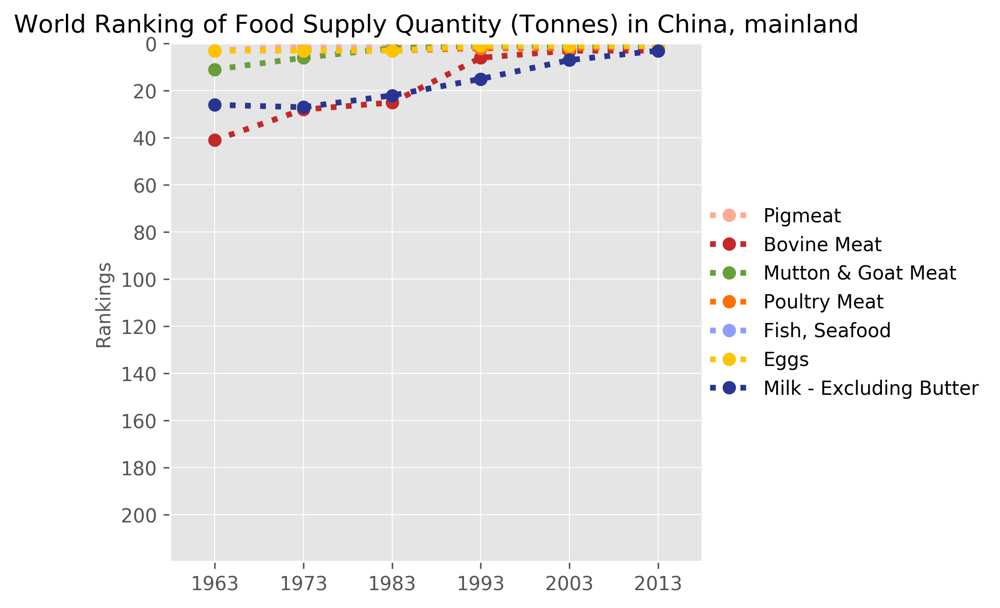

In [32]:
# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E)

### 2. An Area's Main Items and Trends

In [35]:
def plotTrends(
    domain,
    area, 
    element, 
    items_group='',
    items=[],
    toUnit='',   
    changeUnit = 1,             # 单位转换，值变为原来的多少倍
    fig_size = (5, 15),
    colors=CLs,
    stacked=True,
):
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    # select source dataframe
    df = DFs[domain][(DFs[domain]['Area']==area)\
                   & (DFs[domain]['Element']==element)\
                   & (DFs[domain]['Item'].isin(items))].dropna().drop_duplicates().copy()
    
    # create a pivot for a particular area where 
    # years as indices, items as columns 
    # items' values as values, and add a 'Sum' column
    dfs = {}
    for i in items:
        dfs[i] = df[df['Item']==i][['Year','Value']].fillna(0)
        dfs[i]['Value'] = dfs[i]['Value']*changeUnit
        dfs[i]=dfs[i].set_index('Year')
        
    df_items = pd.DataFrame()
    for i in items:
        df_items = pd.concat([df_items, dfs[i]], axis=1)
    df_items.columns=items
    df_items['Sum'] = df_items.apply(lambda x: x.sum(), axis=1)

    display(df_items[items].tail())
    
    # plot settings
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label=element+' ({})'.format(toUnit)
    
    # === if need non-stacked plot ===
    if stacked==False:
        title = 'Trends of {}'.format(element.title(), area)
        
        fig = plt.figure(figsize=(5,4),dpi=300)
        plt.title(title, fontsize=TIT_size)
        
        df_items[items].plot.area(color=colors, stacked=False, alpha=0.4, ax=plt.gca())
        Y_max = df_items[items].values.max()
        
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='upper left')
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, Y_max, Y_label)
        
#         path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_2_b_'  + title[:title.find('/')] + '.png'
#         bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#         fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#         print('Img saved as: ' + path)
        
    # === if need stacked plot ===
    else:
        title = "Trends of {} {} in {}".format(items_group, element, area)
        
        fig = plt.figure(figsize = fig_size, dpi=300)
        fig.tight_layout()                          
        plt.subplots_adjust(wspace =0.2, hspace =0.2)
        
        # ===
        ax = fig.add_subplot(411)
        plt.title(title, fontsize=TIT_size)
        
        df_items[items].plot.line(color=colors, ax=plt.gca())
        Y_max = df_items[items].values.max()
        
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)  
        setY_quant(ax, 1.5*Y_max, Y_label)

        # ===
        ax = fig.add_subplot(412)
        df_items[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())
        Y_max = df_items['Sum'].values.max()
        
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, 1.5*Y_max, Y_label)

        # ===
        ax = fig.add_subplot(413)
        for i in items:
            df_items[i]=df_items[i]/df_items['Sum']*100
        df_items[items].plot.line(color=colors, ax=plt.gca())

        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        # ===
        ax = fig.add_subplot(414)
        df_items[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())

        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

#         path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_2_a_'  + title[:title.find('/')] + '_' + str(time.time()) + '.png'
#         bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#         fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#         print('Img saved as: ' + path)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,4686.3042,628.8898,389.5434,1631.1380,4212.8702,2477.6477,3944.2715
2010,4856.2794,651.6082,403.2487,1661.0319,4372.5062,2498.1866,4158.3198
2011,4875.0089,644.2805,400.6026,1695.5527,4496.3090,2543.6109,4252.2840
2012,5172.3603,660.6176,412.8895,1799.9097,4775.3615,2584.6144,4470.6108
2013,5324.7024,708.9479,433.6508,1828.3598,4775.3615,2599.9089,4525.2209


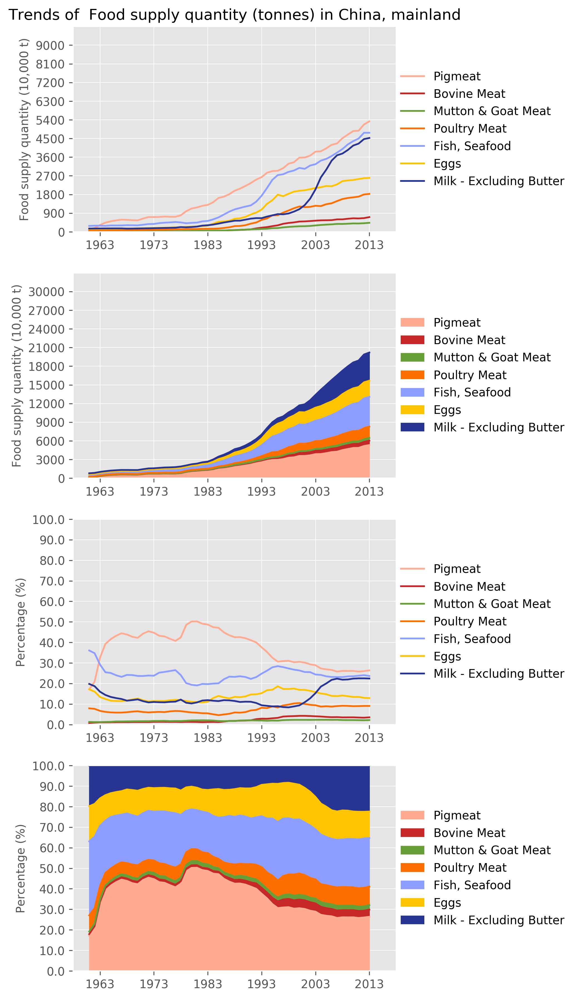

In [34]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 设置颜色
cmeat,cfish,cegg,cmilk,coffal,cfat=\
'peru','deepskyblue','yellowgreen','darkgray','firebrick','orange'
cpig,ccattle,cgoat,cbirds,cother=\
'hotpink','maroon','orangered','gold','lightslategray'

# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
#           )
# plotTrends(D, A, E, items_group='Meat', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

### 3. Compare

In [36]:
# The average of a group
def stat_ofGroup (
    domain,
    area,
    element,
    areas_group,
    areas_group_name,
    res_type,
    items_group='',
    items=[],
):
     # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    df_sum = pd.DataFrame()
    df_avg = pd.DataFrame()
    for i in items:
        df = PVs_YearArea[domain][area][element][i].copy()
        
        areas = []
        for c in df.columns:
            if c in areas_group: areas.append(c)
        df = df[areas]
        df = df.fillna(np.nan)

        df['Sum'] = df.apply(lambda x: x.sum(), axis=1)
        df_sum = pd.concat([df_sum, df['Sum']],axis=1)
        
        df['Avg'] = 0
        for i in df.index:
            num = len(areas) - df.loc[[i]].isna().sum(axis=1)
            df.loc[[i], ['Avg']] = df['Sum']/num
        df_avg = pd.concat([df_avg, df['Avg']],axis=1)
        
    df_sum.columns = items
    df_avg.columns = items
    df_sum.index.names = ['Year']
    df_avg.index.names = ['Year']
    
    if res_type == 'Sum': 
        display (areas_group_name + ' ' + res_type, df_sum.tail(2))
        return df_sum
    
    elif res_type == 'Avg': 
        display (areas_group_name + ' ' + res_type, df_sum.tail(2))
        return df_avg

In [37]:
def trendsOfArea (
    domain,
    area,
    element,
    items_group='',
    items=[],
):
     # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    df_res = pd.DataFrame()
    for i in items:
        df = PVs_YearArea[domain][area][element][i].copy()

        df = df[[area]]
        df_res = pd.concat([df_res, df],axis=1)
        
    df_res.columns = items
    
    display (area, df_res.tail(2))
    return df_res

In [48]:
def compareToGroup(
    domain,
    area,
    element,
    areas_groups,
    areas_groupnames,
    res_type,
    items_group='',
    items=[],
    toUnit='',
    changeUnit=1,
):

    dfs_groups = {}
    for n in range(len(areas_groups)):
        dfs_groups[n] = stat_ofGroup(domain, area, element, areas_groups[n], areas_groupnames[n], res_type, items=items) * changeUnit
        dfs_groups[n].reset_index(inplace=True)
        
    df_area = trendsOfArea (domain, area, element, items=items) * changeUnit
    df_area.reset_index(inplace=True)
    
    df_continent = trendsOfArea (domain, 'Asia', element, items=items) * changeUnit
    df_continent.reset_index(inplace=True)
    
    df_world = trendsOfArea (domain, 'World', element, items=items) * changeUnit
    df_world.reset_index(inplace=True)
    
    
    colors_groups = ['green', 'orange', 'blue']
    color_area = 'red'
    
    # plot settings
    title = 'Compare'
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label=element+' ({})'.format(toUnit)

    fig_size = [15,15]

    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.3, hspace =0.5)
    plt.suptitle(title, fontsize=TIT_size)

    n=0
    for i in items:
        n+=1
        ax = fig.add_subplot(4,3,n)
        
        dfs_groups_max = []
        for m in range(len(areas_groups)):
            dfs_groups[m].plot('Year', i, color=colors_groups[m], ax=plt.gca())
            dfs_groups_max.append( dfs_groups[m][[i]].values.max())
        
        df_area.plot('Year', i, color=color_area, ax=plt.gca())
        
        df_group_max = np.array(dfs_groups_max).max()
        df_area_max = df_area[[i]].values.max()
        Y_max = max(df_group_max, df_area_max)

        ax = plt.gca()
        plt.title('{}'.format(i), fontsize=TIT_size-1)
        areas_groupnames.append(area)
        ax.legend(areas_groupnames, fontsize=LEG_size-1,frameon=False, loc='upper left')
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, 1.5*Y_max, Y_label)
        
#     path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_3_a_'  + title[:title.find('/')] + '_' + str(time.time()) + '.png'
#     bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#     fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#     print('Img saved as: ' + path)

In [49]:
items=ITEMs.copy()
items.append('Meat')

In [50]:
compareToGroup(D,A,E, [LIST_countries_OECD], ['OECD'], 'Sum', items=items, toUnit='10,000 t', changeUnit=1/10000)

'OECD Sum'

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2012,3.6062e+07,2.6649e+07,1973455.0,3.8899e+07,3.1206e+07,1.6630e+07,2.5183e+08,1.0538e+08
2013,3.6140e+07,2.6486e+07,2008618.0,3.9184e+07,3.0894e+07,1.7367e+07,2.5353e+08,1.0565e+08


'China, mainland'

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2012,5.1724e+07,6.6062e+06,4128895.0,1.7999e+07,4.7754e+07,2.5846e+07,4.4706e+07,8.2094e+07
2013,5.3247e+07,7.0895e+06,4336508.0,1.8284e+07,4.7754e+07,2.5999e+07,4.5252e+07,8.4591e+07


KeyError: 'Asia'

In [46]:
def compareToTopAreas(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    toUnit='',
    changeUnit=1,
): 
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
                
    # select pivots for a paticular item
    dfs = PVs_AreaYear[domain][area][element]
    
    
    # plot settings
    years = [Years[-1]-20,Years[-1]]  # set years for compare
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label = element + ' ({})'.format(toUnit)
    title = '{}: China, mainland Vs. Top 5 in the World'.format(element)

    # === Bar Plot ===
    fig_size=(15,15)
    fig=plt.figure(figsize=fig_size, dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.6, hspace =1.)
    
    plt.suptitle(title, fontsize=TIT_size)
    n=0
    for i in items:
        df = dfs[i][dfs[i].index.isin(LIST_countries)].copy()
        df = df*changeUnit
        df = df.fillna(0)
        
        df_area = df[df.index==area][years]
        df_top = df.sort_values([years[-1]],ascending=False)[years].head()
        if area in df_top.index:pass
        else: df_top = pd.concat([df_top,df_area],sort=False)
#         print(Unit)
        display(df_top)
        
        n+=1
        ax = fig.add_subplot(4,3,n)
        df_top.plot.bar(ax=plt.gca())
        ax=plt.gca()
        plt.title('{}: \n{} Vs. World Top 5'.format(i, area), fontsize=TIT_size-1)
        plt.legend(loc='upper left',frameon=False,bbox_to_anchor=(1.,1.),borderaxespad = 0.)
        plt.xticks(rotation=30,ha='right',fontsize=TCK_size)
        plt.xlabel('')
        plt.yticks(fontsize=TCK_size)
        plt.ylabel(Y_label, fontsize=LAB_size)

#     path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_3_b_'  + title[:title.find('/')] + '_' + str(time.time()) + '.png'
#     bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#     fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#     print('Img saved as: ' + path)

,1993,2013
Area,,
"China, mainland",2636.4292,5324.7024
United States of America,786.8457,884.7117
Germany,440.1187,428.6422
Russian Federation,283.6605,366.4885
Viet Nam,85.8300,320.8609


,1993,2013
Area,,
United States of America,1101.6295,1159.8299
Brazil,439.4116,786.3343
"China, mainland",200.0616,708.9479
Russian Federation,400.1546,242.5306
Argentina,220.0218,229.9590


,1993,2013
Area,,
"China, mainland",137.1189,433.6508
India,62.5178,72.5228
Nigeria,18.1156,47.1941
Pakistan,59.4847,44.8375
Sudan,0.0000,37.6210


,1993,2013
Area,,
"China, mainland",572.1477,1828.3598
United States of America,1130.4099,1600.6094
Brazil,270.3753,901.6211
Russian Federation,145.5391,392.8126
Mexico,126.0750,368.5020


,1993,2013
Area,,
"China, mainland",1736.6646,4775.3615
Indonesia,311.5160,703.9343
United States of America,599.3714,688.3420
India,375.6137,631.0377
Japan,837.8838,617.9386


,1993,2013
Area,,
"China, mainland",1069.5691,2599.9089
United States of America,352.4278,466.7264
India,113.4478,323.0630
Japan,250.0022,243.4589
Mexico,107.1871,224.3044


,1993,2013
Area,,
India,5009.3576,10580.7187
United States of America,6701.6601,8151.2731
"China, mainland",658.0394,4525.2209
Pakistan,1449.6861,3335.6361
Brazil,1468.8164,2991.0035


,1993,2013
Area,,
"China, mainland",3596.4940,8459.1307
United States of America,3055.2814,3684.9039
Brazil,868.1930,1955.2001
Russian Federation,875.2579,1068.6529
Mexico,375.7201,761.2939


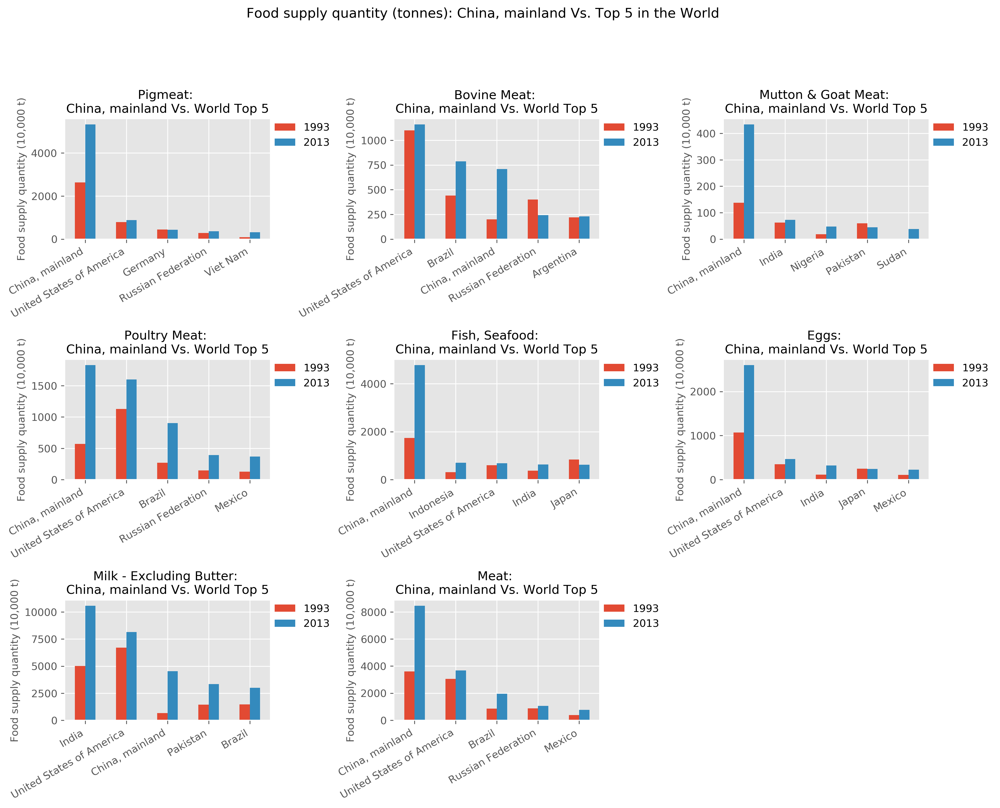

In [47]:
compareToTopAreas(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

### 4. Main Contribution of an Area

In [48]:
# 设置主要贡献方面
ITEMs_main = ['Pigmeat', 'Fish, Seafood', 'Eggs']

In [49]:
def mkPVs_compareAreaToGroup(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
):
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    # transposed from PVs (Area-Year) to new pivots (Year-Area) for a particular item
    pivots={}
    n=0
    for i in items:
        n+=1
        pivots[i]=PVs_AreaYear[domain][area][element][i].copy()
        pivots[i]=pivots[i][pivots[i].index.isin([area, group])].transpose()
        pivots[i].index.names = ['Year']
#         print(i)
#         display(pivots[i].tail(2))
    
    # make a pivot for a particular area where 'Area' as index, items as columns
    pivot_A=pd.DataFrame()
    for i in items:
        pivot_A = pd.concat([pivot_A, pivots[i][area]], axis=1)
    pivot_A.columns=items
#     print(area)
#     display(pivot_A.tail(2))
    
    # make a pivot for the group where the area is in, where 'Area' as index, items as columns
    pivot_G=pd.DataFrame()
    for i in items:
        pivot_G = pd.concat([pivot_G, pivots[i][group]], axis=1)
    pivot_G.columns=items
#     print(group)
#     display(pivot_G.tail(2))
    
    # a dictionary contains 3 pivots above
    pivots_AG={
        (area,group):pivots,
        area:pivot_A,
        group:pivot_G,
    }
    return pivots_AG

In [50]:
def proportion_AreaToGroup(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    toUnit='',
    changeUnit=1,
    kind='area',
):        
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    # make a dictionary of 'mkPVs_compareAreaToGroup()'
    PVs_AG[domain]={}
    PVs_AG[domain][area]={}
    PVs_AG[domain][area][element]=mkPVs_compareAreaToGroup(domain, area, element,items=items)

    # plot settings
    fig_row=(len(items)+1)//2
    fig_size=(10,fig_row*3)
    
    title = "{}: {} VS {}".format(element, area, group)
    
    if kind=='area':alpha=0.4
    else:alpha=1
        
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label=element+' ({})'.format(toUnit)

    # ===
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.3, hspace =0.3)
    plt.suptitle(title, fontsize=TIT_size)
    
    n=0
    for i in items:
        n+=1
        ax = fig.add_subplot(fig_row,2,n)
        plt.title(i, fontsize=TIT_size)
        df = PVs_AG[domain][area][element][(area,group)][i].copy()
        df=df*changeUnit
        df.plot(kind=kind,stacked=False, alpha=alpha, ax=plt.gca())

        ax=plt.gca()
        ax.legend(fontsize=LEG_size, loc='upper left')

        X_step=5
        setX_quant(ax, X_ticks, X_step)

        Y_max=df.values.max()
        setY_quant(ax, 1.5*Y_max, Y_label)
    
#     path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_4_'  + title[:title.find('\/')] + '.png'
#     bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#     fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#     print('Img saved as: ' + path)

In [52]:
proportion_AreaToGroup(D,A,E, items=items, toUnit='10,000 t', changeUnit=1/10000, kind='area')

In [53]:
def pi_compareAreaToGroup(
    domain,
    area,
    element,
    items_group='',
    items=[],
    years=[Years[0],Years[-1]],
    group='World',
    other='Other Areas',
    colors=CLs,
    fig_size=(13,6),
):
    
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
                
    # plot settings
    title = "Proportions of Different {} in {} and the Proportions {} takes".format(element, group, area)
        
    # plot all items in the world...
    
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.3, hspace =0.2)
    plt.suptitle(title, fontsize=TIT_size)

    fig_no=0
    for y in years:
        fig_no+=1

        df=pd.concat([PVs_AG[domain][area][element][area].loc[y],
                      PVs_AG[domain][area][element][group].loc[y]],axis=1).copy()

        df=df[df.index.isin(items)]
        df.columns=[area,group]
        df[other] = df[group] - df[area]

        print(y)
        display(df)

        ax = fig.add_subplot(1,2, fig_no)
        plt.title(y, fontsize=TIT_size)

        size = 0.5
        outer_radius = 2
        inner_colors = ['r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray']

        outer_explode = np.zeros(len(items))
        inner_explode = np.zeros(len(items*2))

        for n in range(len(items)):
            if items[n] in ITEMs_main:
                outer_explode[n] = 0.15
                inner_explode[2*n] = 0.15

        area_pct = ['{}{}'.format(int(df.loc[i][area]/df.loc[i][group]*100),'%') for i in df.index.values]
        inner_labels = []
        for i in area_pct:
            inner_labels.append(i)
            inner_labels.append('')

        shadow = False
        startangle = 0
        plt.pie(df[group].values, 
                autopct='%1.0f%%',
                pctdistance=1.06,
                explode=list(outer_explode),
                radius=outer_radius, 
                colors=colors,
                center = (0,0),
                textprops = {'fontsize':LEG_size}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
                )
        plt.pie(df[[area,other]].values.flatten(), 
                labels=inner_labels,
                labeldistance = 0.8,
                explode=list(inner_explode),
                radius=outer_radius-size, 
                colors=inner_colors,
                center = (0,0),
                textprops = {'fontsize':LEG_size}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
               )
        plt.axis('equal')          # equal 使得为正圆

    ax=plt.gca()
    ax.legend(labels=list(df.index.values)+[area,other],frameon=False,fontsize=LEG_size, 
              loc='lower center',bbox_to_anchor=(-0.1,-0.1),borderaxespad = 0.)
    
#     path = './results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_5_'  + title[:title.find('\/')] + '.png'
#     bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
#     fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
#     print('Img saved as: ' + path)

1961


,"China, mainland",World,Other Areas
Pigmeat,1.3485e+06,2.4435e+07,2.3086e+07
Bovine Meat,5.9500e+04,2.8584e+07,2.8525e+07
Mutton & Goat Meat,1.0000e+05,5.8495e+06,5.7495e+06
Poultry Meat,6.1894e+05,8.7680e+06,8.1490e+06
"Fish, Seafood",2.8356e+06,2.7454e+07,2.4619e+07
Eggs,1.3464e+06,1.3869e+07,1.2522e+07
Milk - Excluding Butter,1.5546e+06,2.3026e+08,2.2871e+08


2013


,"China, mainland",World,Other Areas
Pigmeat,5.3247e+07,1.1210e+08,5.8857e+07
Bovine Meat,7.0895e+06,6.5218e+07,5.8129e+07
Mutton & Goat Meat,4.3365e+06,1.3387e+07,9.0506e+06
Poultry Meat,1.8284e+07,1.0487e+08,8.6590e+07
"Fish, Seafood",4.7754e+07,1.3283e+08,8.5075e+07
Eggs,2.5999e+07,6.4332e+07,3.8333e+07
Milk - Excluding Butter,4.5252e+07,6.2975e+08,5.8449e+08


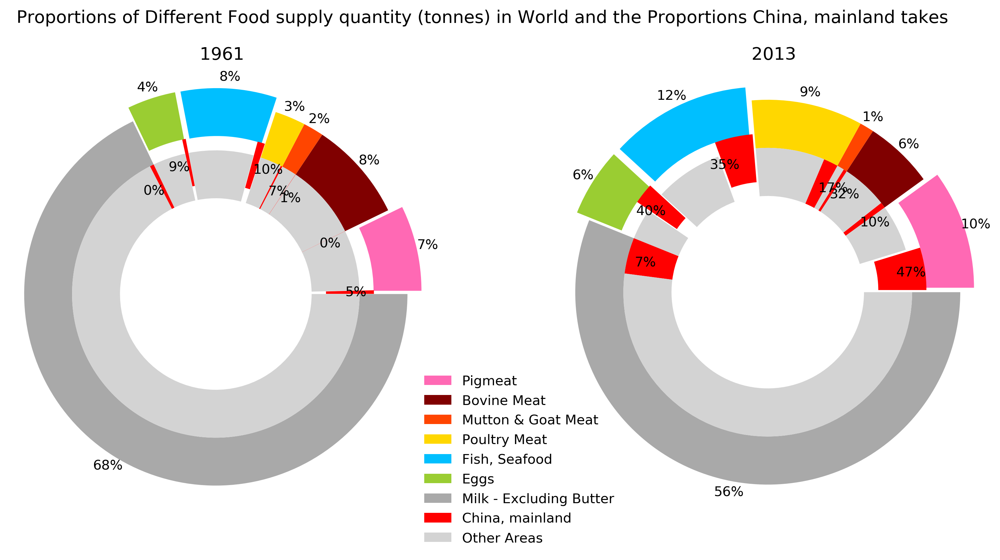

In [54]:
pi_compareAreaToGroup(D,A,E)

# Part 2. 'Food supply quantity (g/capita/day)'

['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']
['Pigmeat', 'Fish, Seafood', 'Meat, Other', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Bovine Meat', 'Poultry Meat', 'Mutton & Goat Meat', 'Animal fats', 'Meat']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
1963,60.0,150.0,129.0,104.0,104.0,73.0,146.0
1973,49.0,150.0,120.0,123.0,115.0,88.0,148.0
1983,41.0,150.0,107.0,124.0,115.0,90.0,147.0
1993,35.0,165.0,89.0,110.0,68.0,46.0,164.0
2003,28.0,138.0,60.0,102.0,45.0,5.0,149.0
2013,16.0,122.0,49.0,107.0,26.0,3.0,130.0


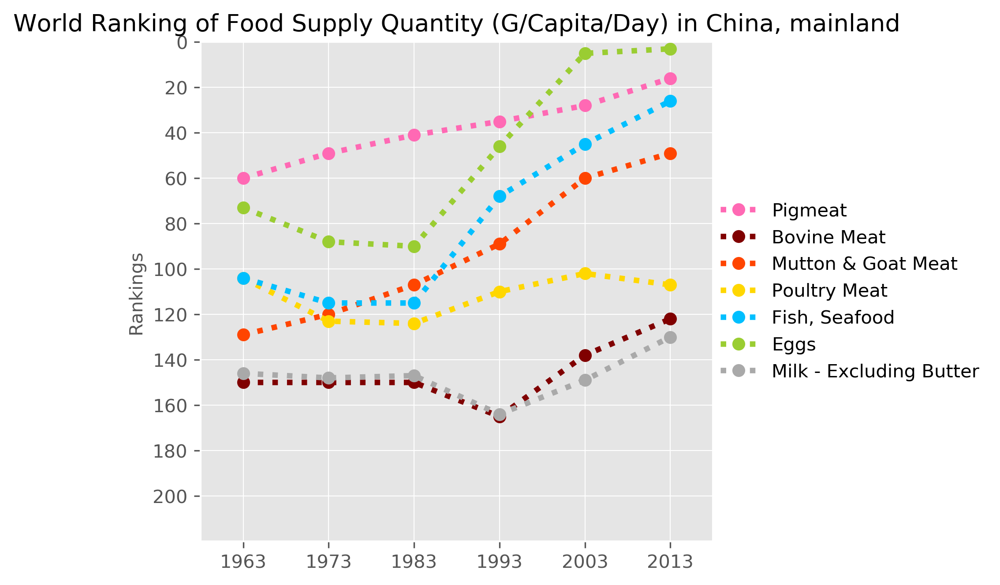

In [55]:
E = 'Food supply quantity (g/capita/day)'
toUnit = ''
changeUnit = 1

# 生成条件
CDTs[D][A][E] = Is
# print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)
# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

PVs_YearArea[D]={}
PVs_YearArea[D][A]={}
PVs_YearArea[D][A][E] = mkPVs_forItem_YearArea(D, A, E, IsGroup)
# for i, pv in PVs_YearArea[D][A][E].items():
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,95.02,12.75,7.90,33.07,85.42,50.24,79.97
2010,97.84,13.13,8.12,33.47,88.10,50.33,83.78
2011,97.60,12.90,8.02,33.95,90.02,50.93,85.13
2012,102.91,13.14,8.21,35.81,95.01,51.42,88.94
2013,105.29,14.02,8.57,36.15,94.42,51.41,89.48


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,151.77,85.42,50.24,79.97,8.21,5.36
2010,155.73,88.10,50.33,83.78,9.20,5.44
2011,155.75,90.02,50.93,85.13,9.41,5.73
2012,163.33,95.01,51.42,88.94,9.38,5.71
2013,167.27,94.42,51.41,89.48,9.43,5.49


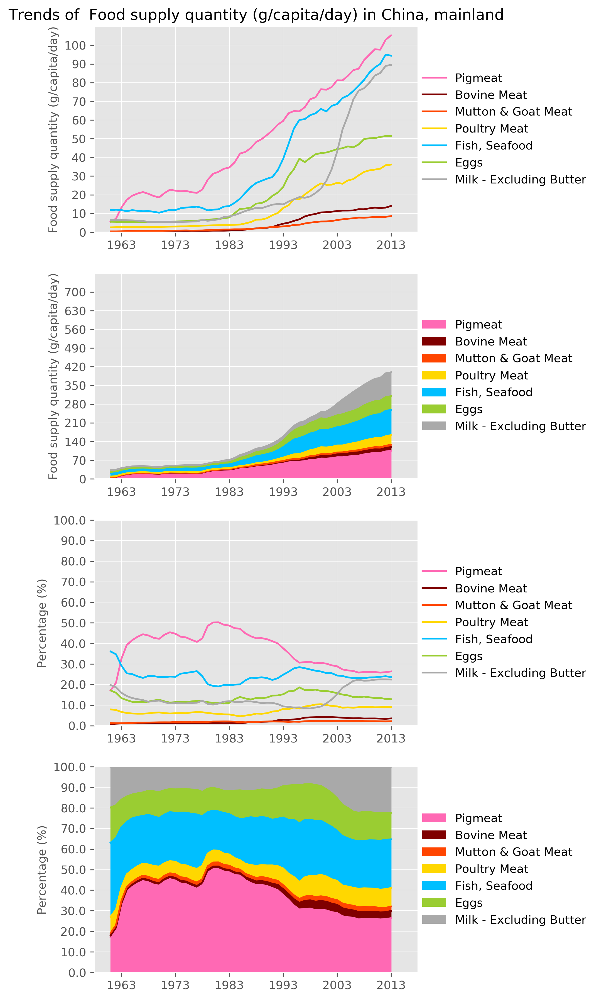

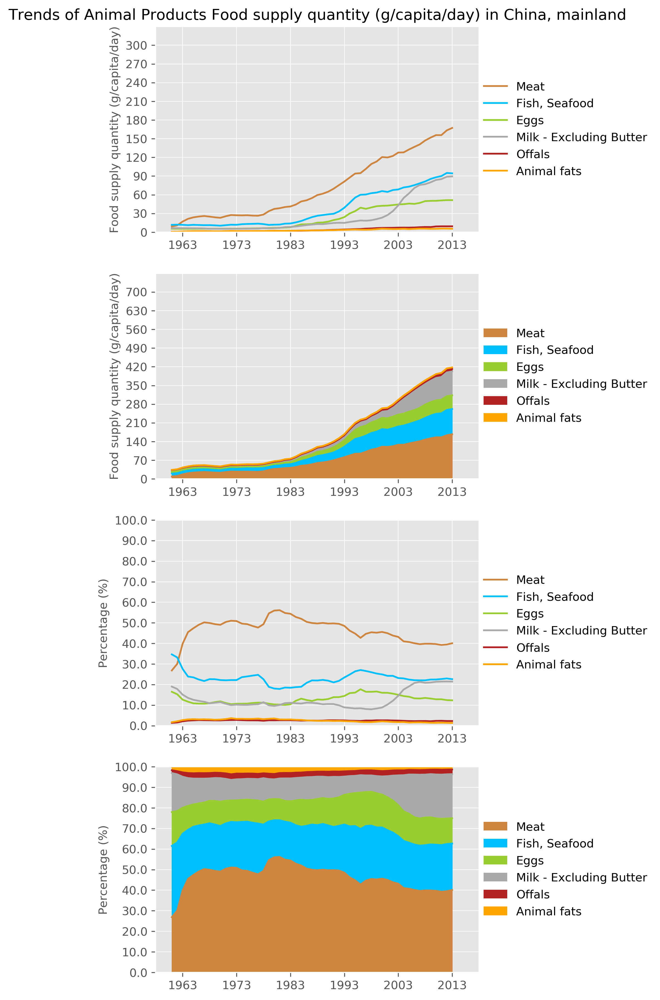

In [56]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
# plotTrends(D, A, E, items_group='Meat', 
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

'OECD Avg'

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2012,2949.25,1661.38,298.38,2440.87,2422.22,1089.82,21420.81,7531.18
2013,2916.53,1671.23,292.63,2445.38,2438.54,1121.47,21623.44,7517.87


'Asia Avg'

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2012,921.29,979.55,558.14,2053.89,3049.91,712.47,8517.84,4741.15
2013,936.81,999.41,561.67,2026.64,2993.10,749.10,8628.57,4753.00


'World Avg'

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2012,6695.26,5297.37,1433.53,9647.50,9309.42,3237.21,53210.84,23915.27
2013,6749.57,5273.42,1436.31,9726.88,9271.26,3348.19,53409.87,24019.75


'China, mainland'

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2012,102.91,13.14,8.21,35.81,95.01,51.42,88.94,163.33
2013,105.29,14.02,8.57,36.15,94.42,51.41,89.48,167.27


Img saved as: ./results/FAO_LivestockFish_FoodSupplyQuantity/img/Fig_3_a_Compar_1571113407.206493.png


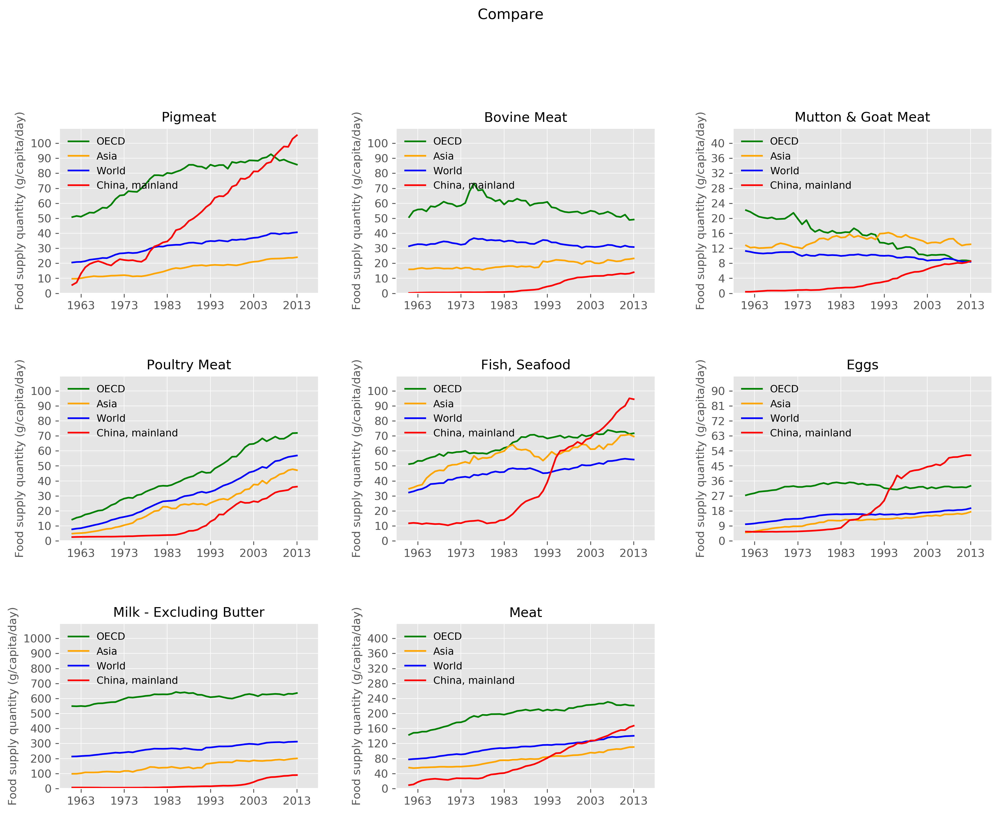

In [81]:
items=ITEMs.copy()
items.append('Meat')
compareToGroup(D,A,E,[LIST_group_OECD, LIST_group_asia, LIST_countries], ['OECD', 'Asia', 'World'], 'Avg', items=items)

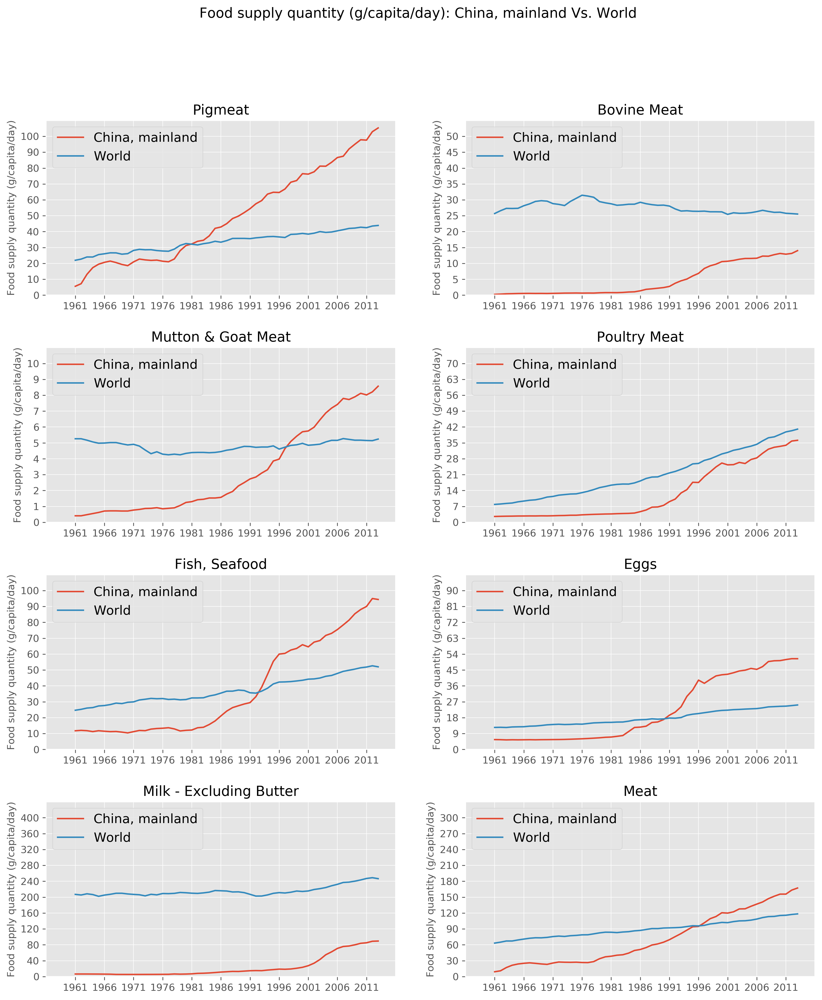

In [35]:
compareToTopAreas(D, A, E, items=items)
proportion_AreaToGroup(D,A,E, items=items, kind='line')

# pi_compareAreaToGroup(D,A,E)

# Part 3. 'Food supply (kcal/capita/day)'

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply (kcal/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal P

,1961,2013
Grand Total,150.0,54.0
Animal Products,146.0,56.0
Meat,140.0,9.0
"Fish, Seafood",106.0,47.0
Eggs,70.0,2.0
Milk - Excluding Butter,138.0,130.0


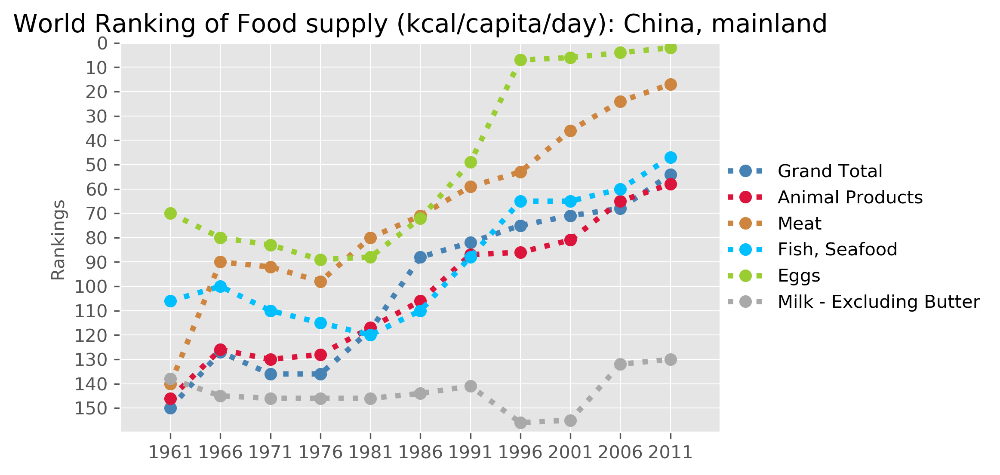

In [36]:
E = 'Food supply (kcal/capita/day)'
toUnit = ''
changeUnit = 1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ctotal,canimal,cmeat='steelblue','crimson','peru'
ranking_AreaItemInWorld(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    colors=[ctotal,canimal,cmeat,cfish,cegg,cmilk],
    rank_max=150)

items = ['Grand Total', 'Animal Products']


,Grand Total,Animal Products
Year,,
2009,2994.0,668.0
2010,3044.0,687.0
2011,3081.0,690.0
2012,3100.0,715.0
2013,3108.0,724.0


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,338.0,26.0,16.0,57.0,46.0,74.0,53.0
2010,348.0,27.0,16.0,58.0,47.0,74.0,55.0
2011,346.0,27.0,16.0,59.0,48.0,75.0,56.0
2012,361.0,27.0,17.0,62.0,50.0,76.0,58.0
2013,369.0,28.0,17.0,63.0,50.0,76.0,58.0


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,441.0,46.0,74.0,53.0,9.0,37.0
2010,454.0,47.0,74.0,55.0,10.0,37.0
2011,452.0,48.0,75.0,56.0,10.0,39.0
2012,471.0,50.0,76.0,58.0,10.0,39.0
2013,482.0,50.0,76.0,58.0,10.0,38.0


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,338.0,26.0,16.0,57.0,4.0
2010,348.0,27.0,16.0,58.0,4.0
2011,346.0,27.0,16.0,59.0,4.0
2012,361.0,27.0,17.0,62.0,4.0
2013,369.0,28.0,17.0,63.0,4.0


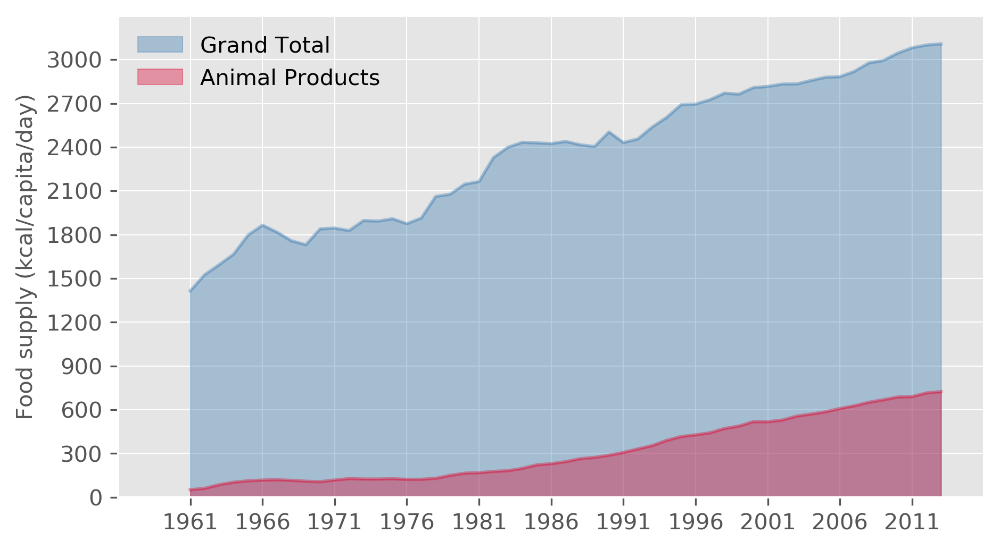

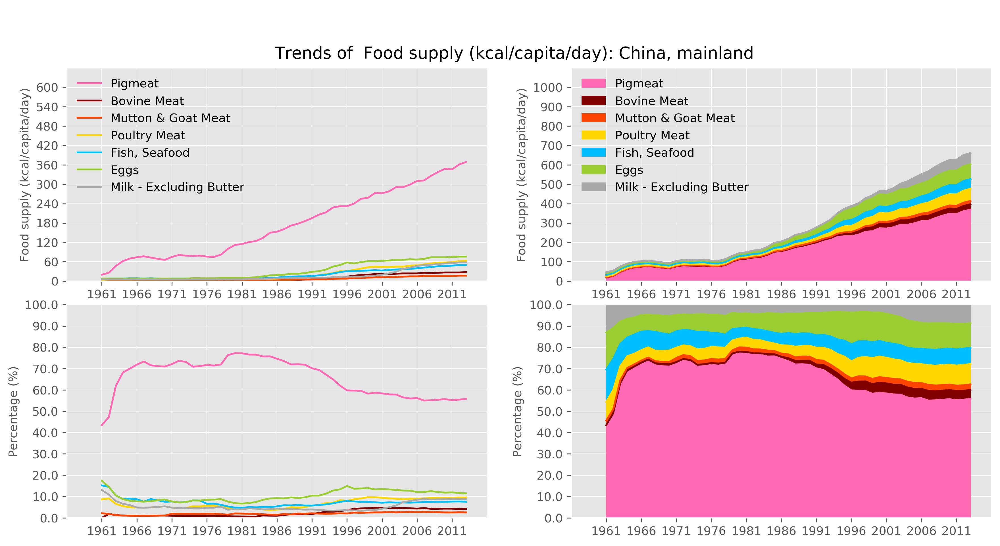

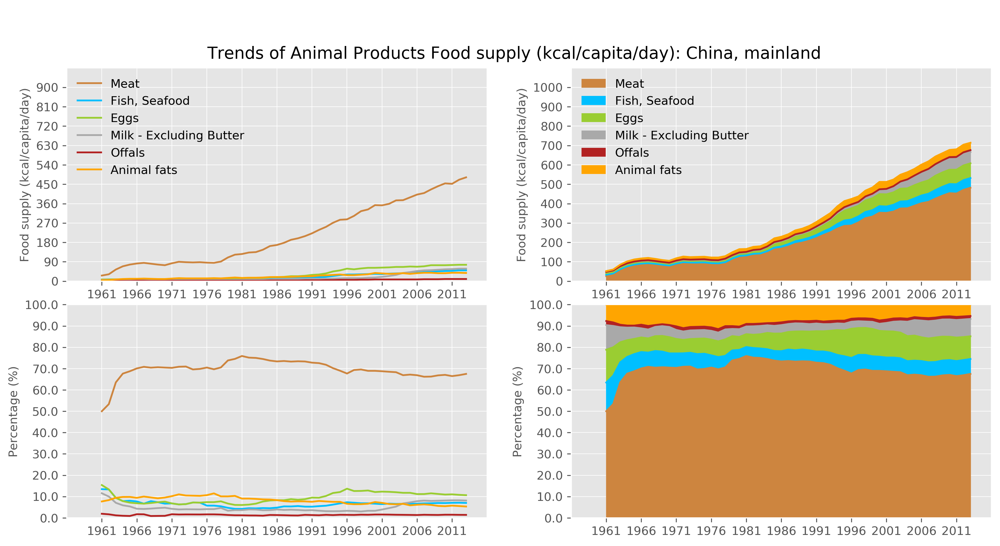

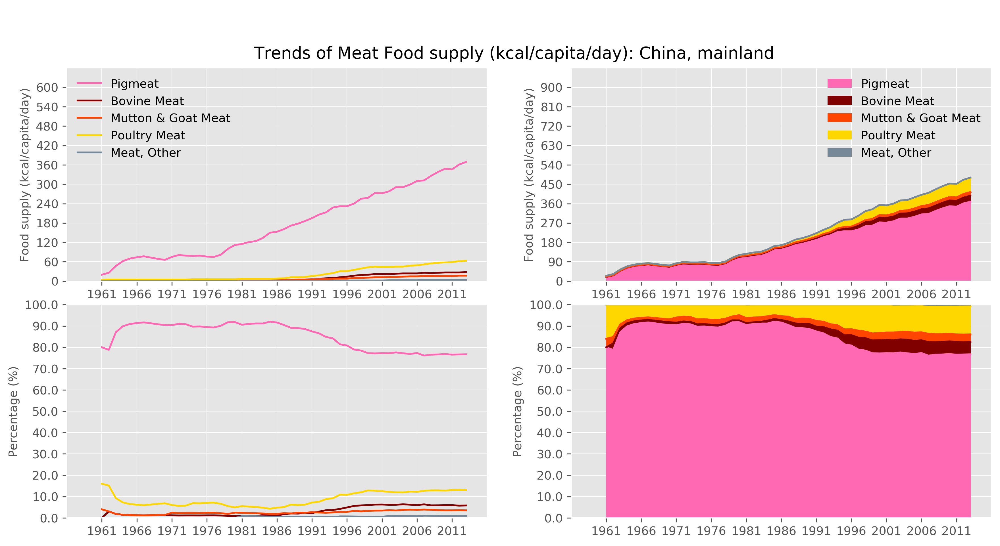

In [37]:
plotTrends(D, A, E, items_group='Grand Total', 
           toUnit='', changeUnit = 1,
           colors=[ctotal,canimal],
           stacked=False,
          )

# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 根据需要设置items和颜色


# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='', changeUnit = 1,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='', changeUnit = 1,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

In [67]:
# compareToTopAreas(D, A, E)

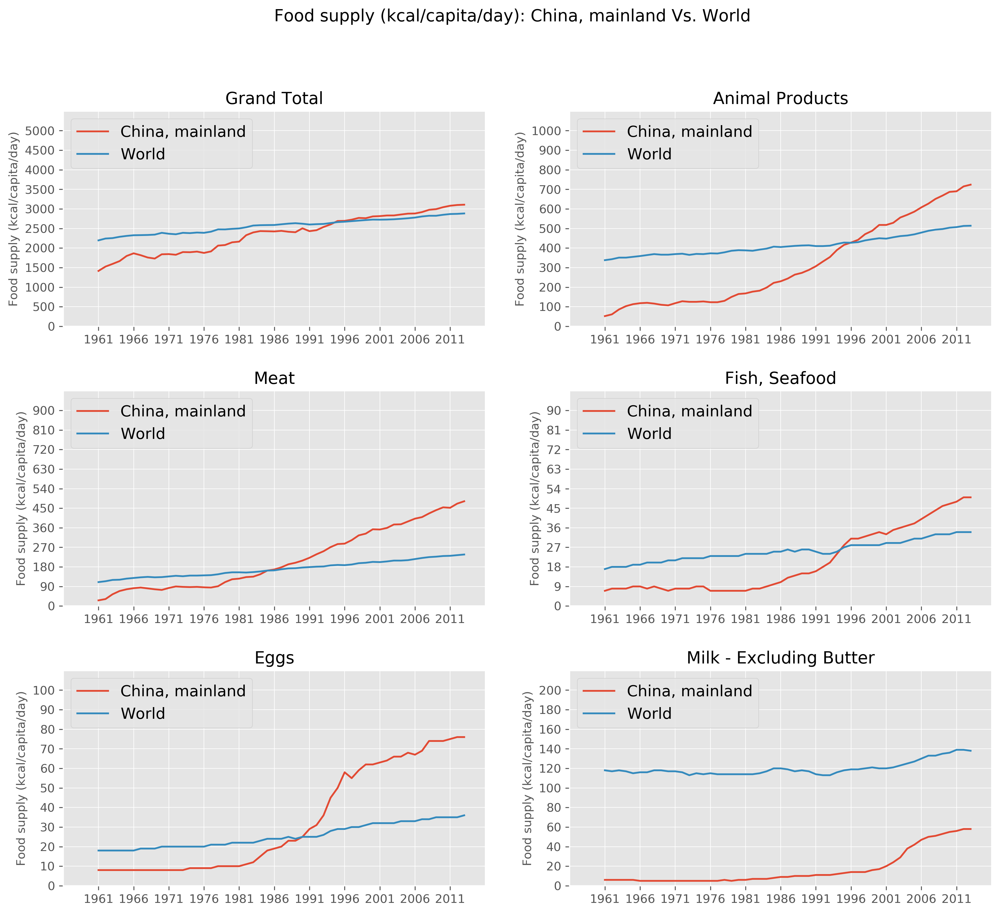

In [38]:
proportion_AreaToGroup(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    kind='line',
)

# pi_compareAreaToGroup(D,A,E)

# 'Protein supply quantity (g/capita/day)'

In [40]:
E = 'Protein supply quantity (g/capita/day)'
toUnit=''
changeUnit=1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# # 根据需要设置items和颜色
# ranking_AreaItemInWorld(
#     D,A,E,
#     items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
#     colors=[ctotal,canimal,cmeat,cfish,cegg,cmilk],
#     rank_max=150)

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply (kcal/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal P

items = ['Grand Total', 'Animal Products']


,Grand Total,Animal Products
Year,,
2009,92.63,36.06
2010,94.98,37.10
2011,95.64,37.45
2012,97.37,38.85
2013,98.02,39.28


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,10.51,1.75,1.08,3.89,7.63,5.76,2.76
2010,10.82,1.80,1.12,3.94,7.84,5.77,2.89
2011,10.78,1.77,1.10,3.99,8.04,5.84,2.92
2012,11.32,1.80,1.13,4.23,8.38,5.89,3.04
2013,11.58,1.92,1.18,4.26,8.33,5.89,3.07


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,17.78,7.63,5.76,2.76,1.46,0.00
2010,18.25,7.84,5.77,2.89,1.64,0.00
2011,18.24,8.04,5.84,2.92,1.68,0.01
2012,19.06,8.38,5.89,3.04,1.68,0.01
2013,19.52,8.33,5.89,3.07,1.69,0.01


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,10.51,1.75,1.08,3.89,0.54
2010,10.82,1.80,1.12,3.94,0.57
2011,10.78,1.77,1.10,3.99,0.59
2012,11.32,1.80,1.13,4.23,0.58
2013,11.58,1.92,1.18,4.26,0.58


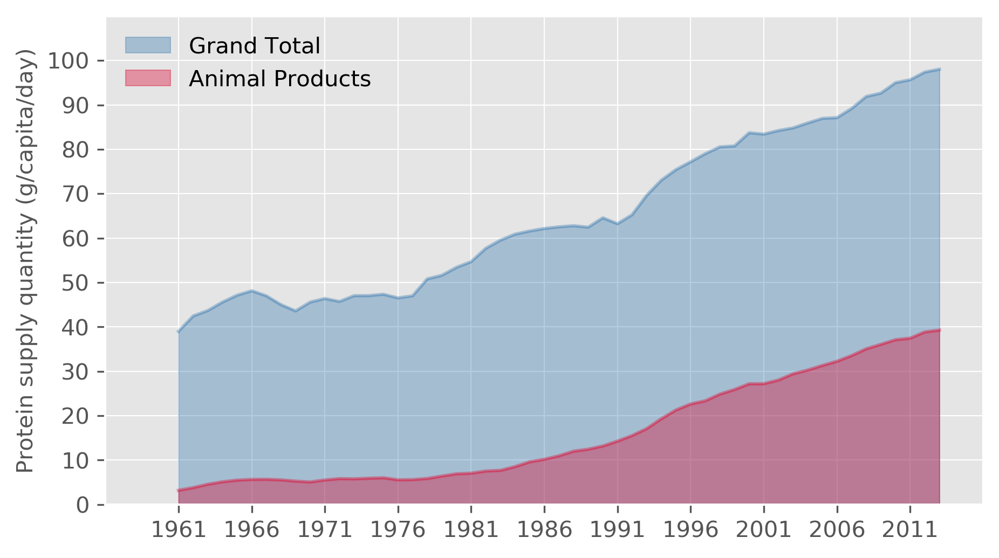

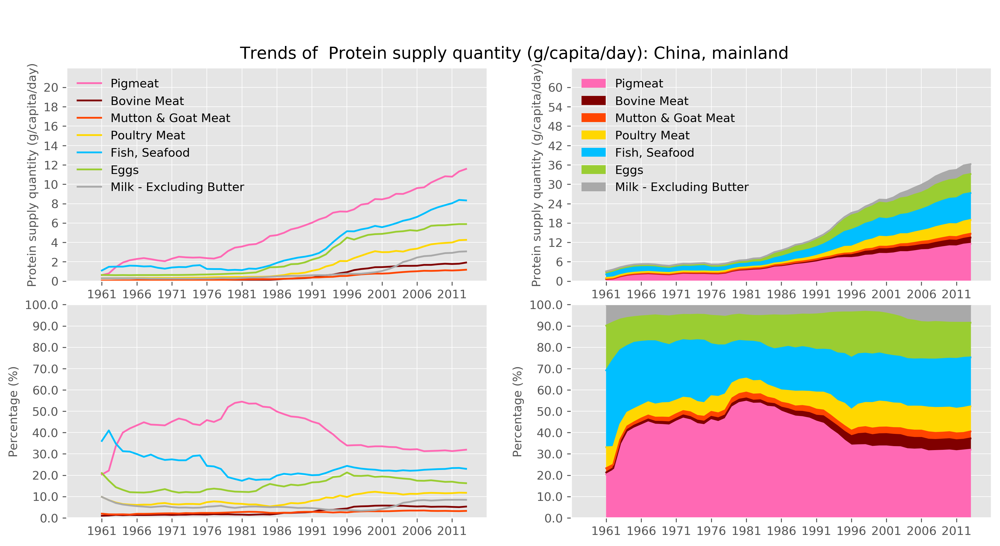

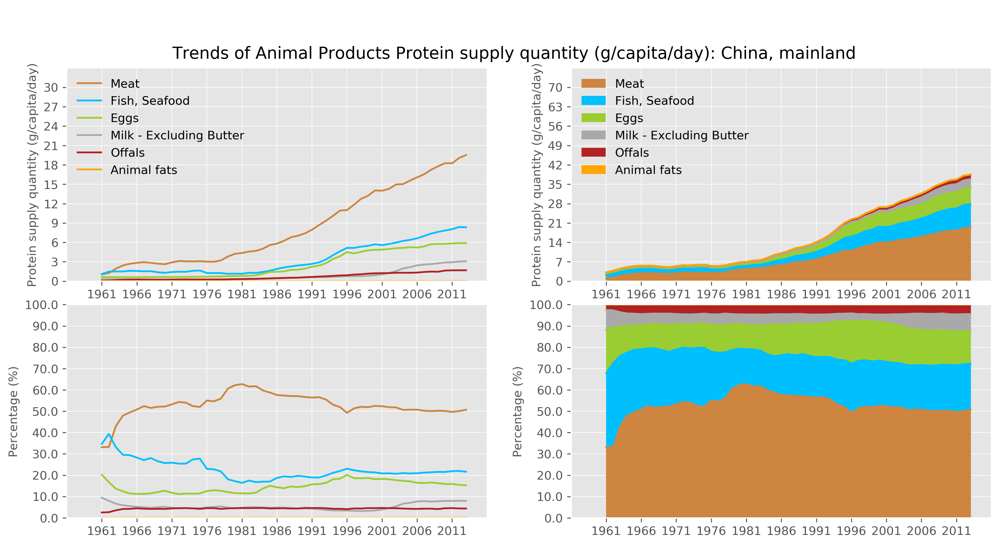

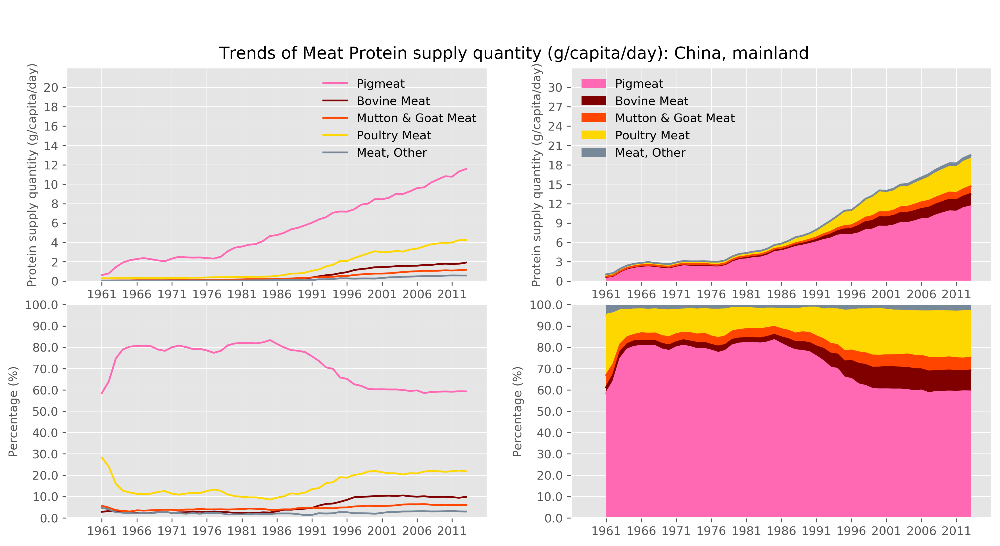

In [41]:
plotTrends(D, A, E, items_group='Grand Total', 
           toUnit='', changeUnit = 1,
           colors=[ctotal,canimal],
           stacked=False,
          )

# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 根据需要设置items和颜色


# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='', changeUnit = 1,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='', changeUnit = 1,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

In [42]:
# compareToTopAreas(D, A, E)

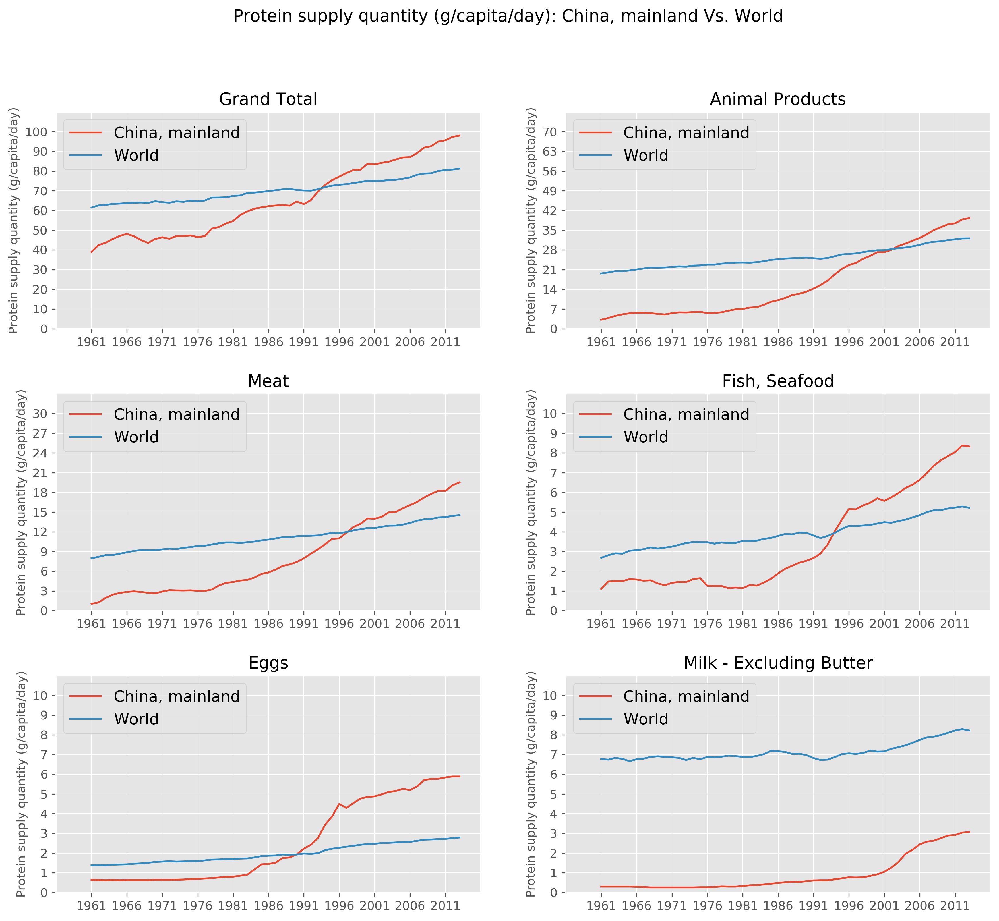

In [43]:
proportion_AreaToGroup(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    kind='line',
)

# pi_compareAreaToGroup(D,A,E)

# 'Fat supply quantity (g/capita/day)'

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply (kcal/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal P

,1961,2013
Grand Total,149.0,59.0
Animal Products,138.0,42.0
Meat,134.0,6.0
"Fish, Seafood",107.0,66.0
Eggs,65.0,1.0
Milk - Excluding Butter,132.0,127.0


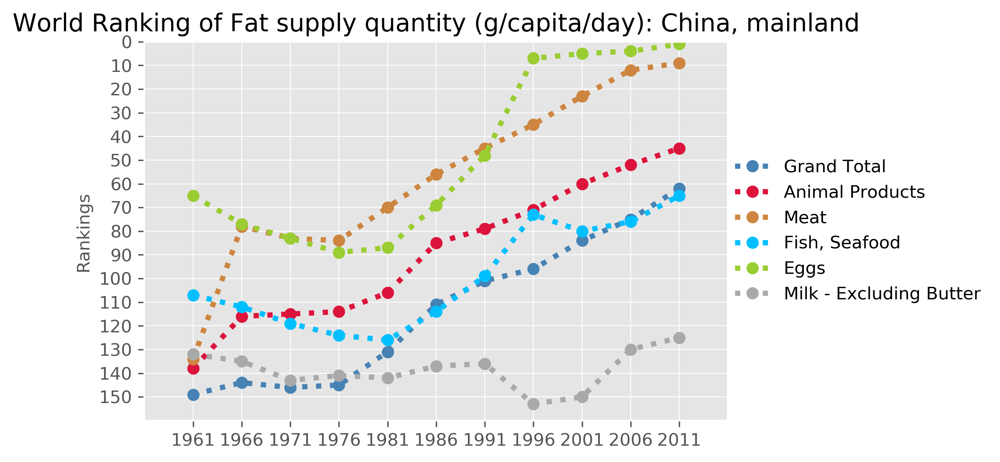

In [45]:
E = 'Fat supply quantity (g/capita/day)'
toUnit=''
changeUnit=1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    colors=[ctotal,canimal,cmeat,cfish,cegg,cmilk],
    rank_max=150)

items = ['Grand Total', 'Animal Products']


,Grand Total,Animal Products
Year,,
2009,91.11,54.45
2010,93.14,55.86
2011,93.19,56.06
2012,94.79,57.97
2013,95.12,58.74


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,32.46,2.10,1.27,4.48,1.31,5.27,3.00
2010,33.41,2.17,1.29,4.57,1.35,5.28,3.13
2011,33.22,2.13,1.28,4.66,1.39,5.34,3.14
2012,34.64,2.16,1.31,4.90,1.43,5.39,3.25
2013,35.41,2.25,1.38,4.94,1.42,5.39,3.22


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,40.46,1.31,5.27,3.00,0.28,4.08
2010,41.60,1.35,5.28,3.13,0.32,4.14
2011,41.44,1.39,5.34,3.14,0.32,4.38
2012,43.16,1.43,5.39,3.25,0.32,4.37
2013,44.13,1.42,5.39,3.22,0.33,4.21


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,32.46,2.10,1.27,4.48,0.15
2010,33.41,2.17,1.29,4.57,0.15
2011,33.22,2.13,1.28,4.66,0.16
2012,34.64,2.16,1.31,4.90,0.16
2013,35.41,2.25,1.38,4.94,0.16


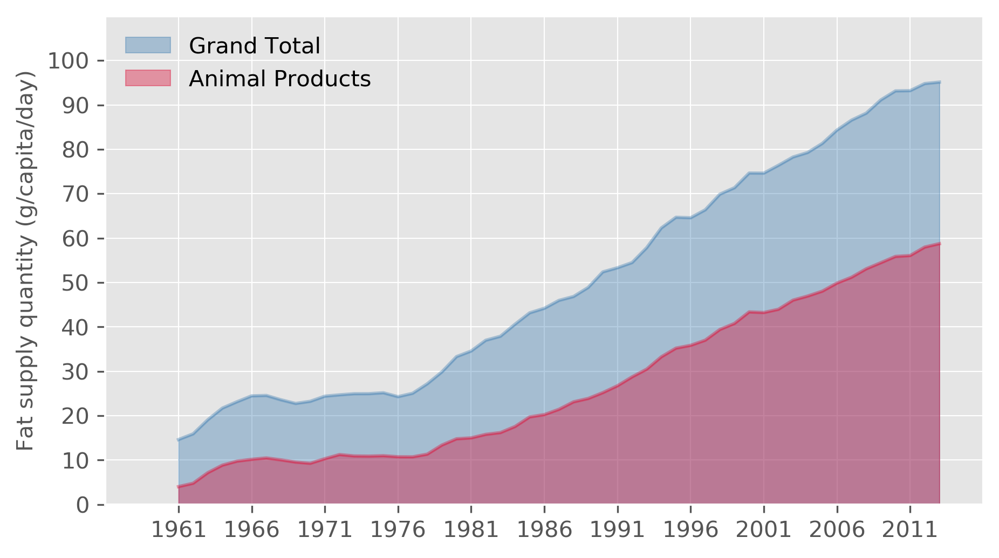

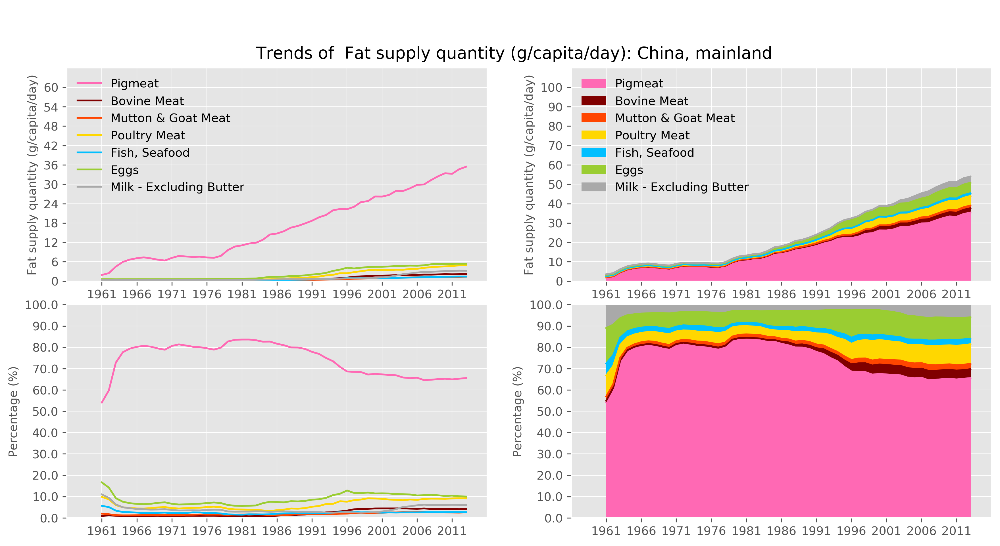

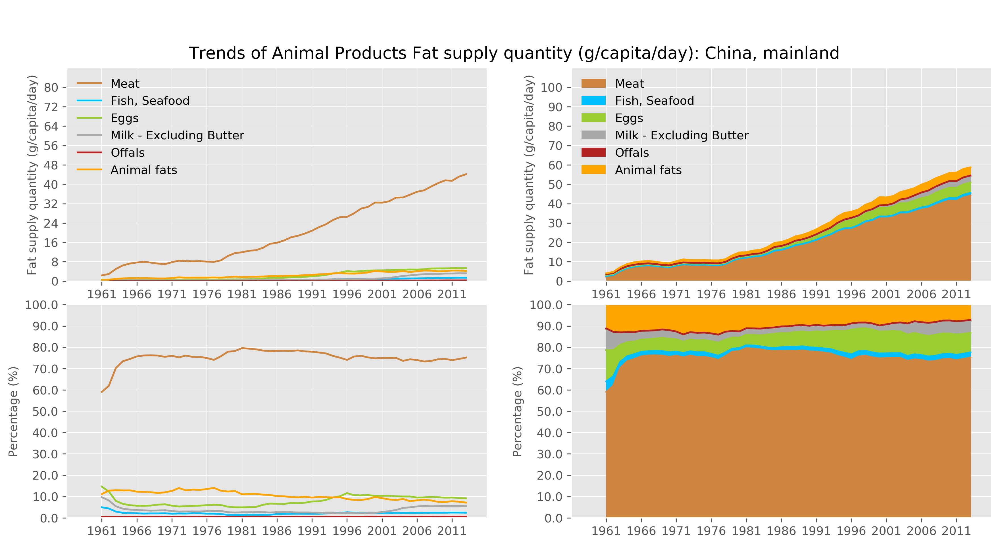

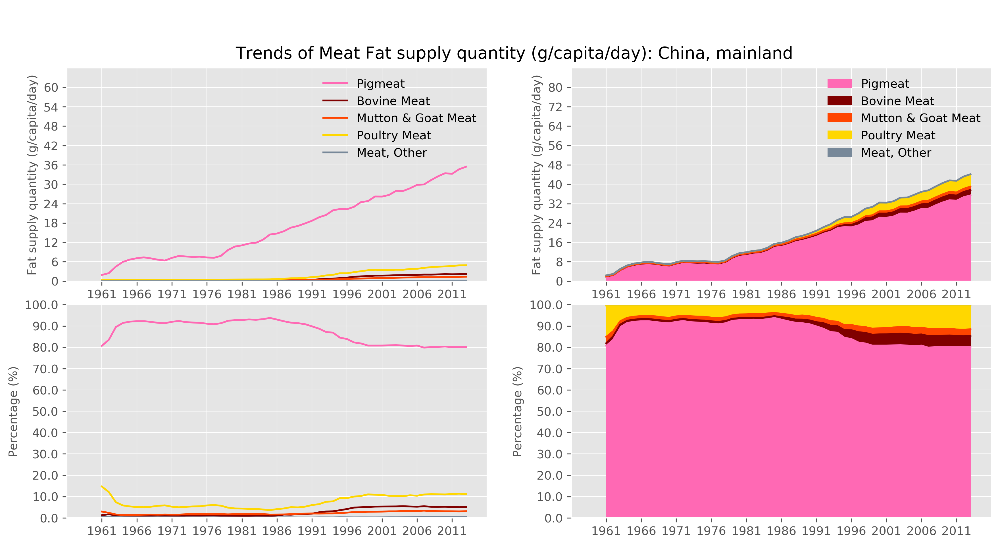

In [46]:
plotTrends(D, A, E, items_group='Grand Total', 
           toUnit='', changeUnit = 1,
           colors=[ctotal,canimal],
           stacked=False,
          )

# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 根据需要设置items和颜色


# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='', changeUnit = 1,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='', changeUnit = 1,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

In [47]:
# compareToTopAreas(D, A, E)

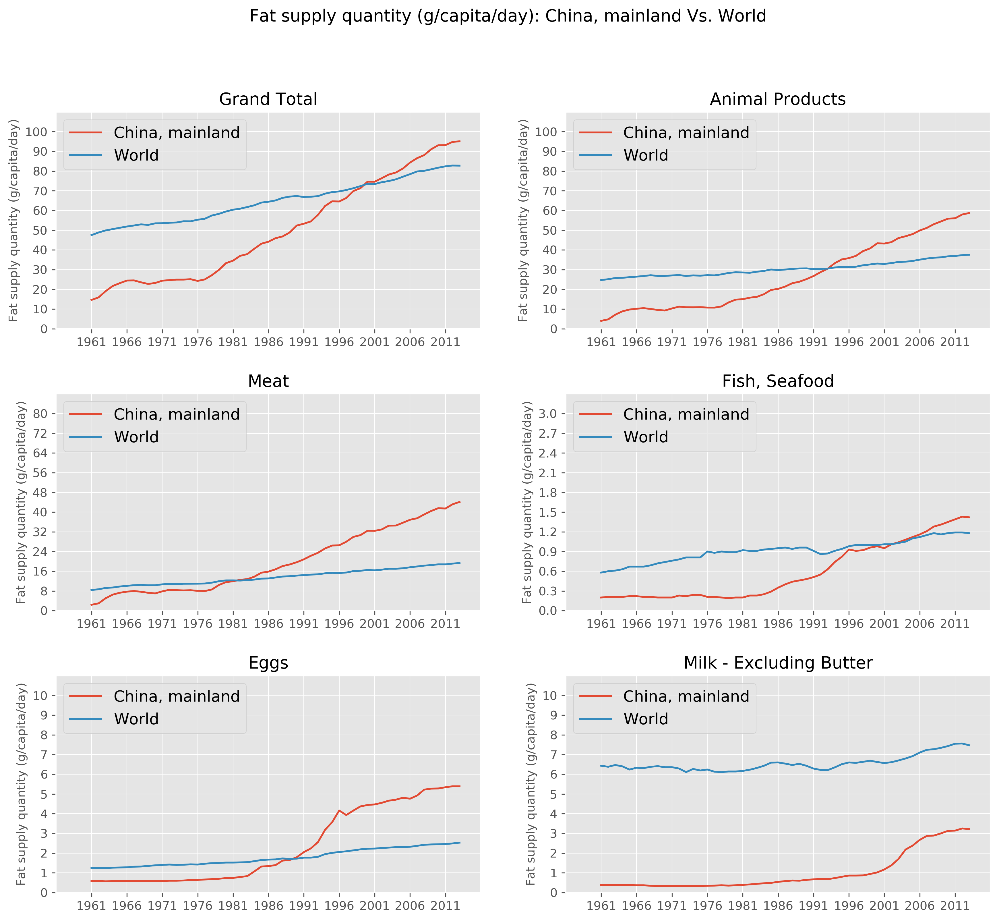

In [48]:
proportion_AreaToGroup(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    kind='line',
)

# pi_compareAreaToGroup(D,A,E)

In [ ]:
? * : " < > \ / |